In [13501]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs
from scipy.stats import multivariate_normal
from scipy.optimize import linear_sum_assignment
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans, SpectralClustering, Birch
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.metrics import confusion_matrix, classification_report, adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from matplotlib.lines import Line2D
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 
warnings.filterwarnings("ignore", message="'force_all_finite' was renamed")
from main import CorrelatedClusterGenerator, evaluate_clustering, create_cluster_dataset

# data

In [13502]:
np.random.seed(42)

In [13503]:
N_CLUSTER = 7

In [13504]:
CORRELATION = 0.9

In [13505]:
NOISE_STD = 5

In [13506]:
N_SAMPLE = 2500

In [13507]:
N_FEATURES = 15

In [13508]:
X = create_cluster_dataset(n_samples=N_SAMPLE,
                             n_features=N_FEATURES,
                             n_clusters=N_CLUSTER,
                             correlation=CORRELATION,
                             noise_std=NOISE_STD,
                             cluster_std=[5.0, 2.5, 0.5, 2.5, 0.5, 2.5, 0.5],
                             separation_factor=2.0,
                             sample_distribution=[900, 450, 450, 225, 225, 125, 125],
                             random_state=42)

In [13509]:
X.shape

(2500, 16)

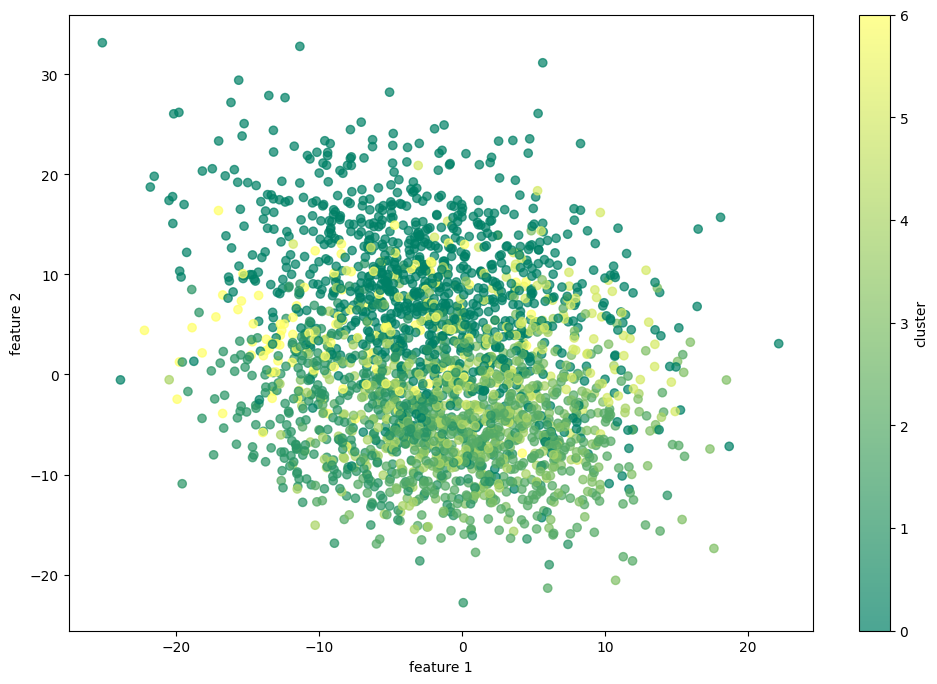

In [13510]:
plt.figure(figsize=(12,8))
plt.scatter(X['var_1'],X['var_2'],c=X['target'],cmap='summer',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

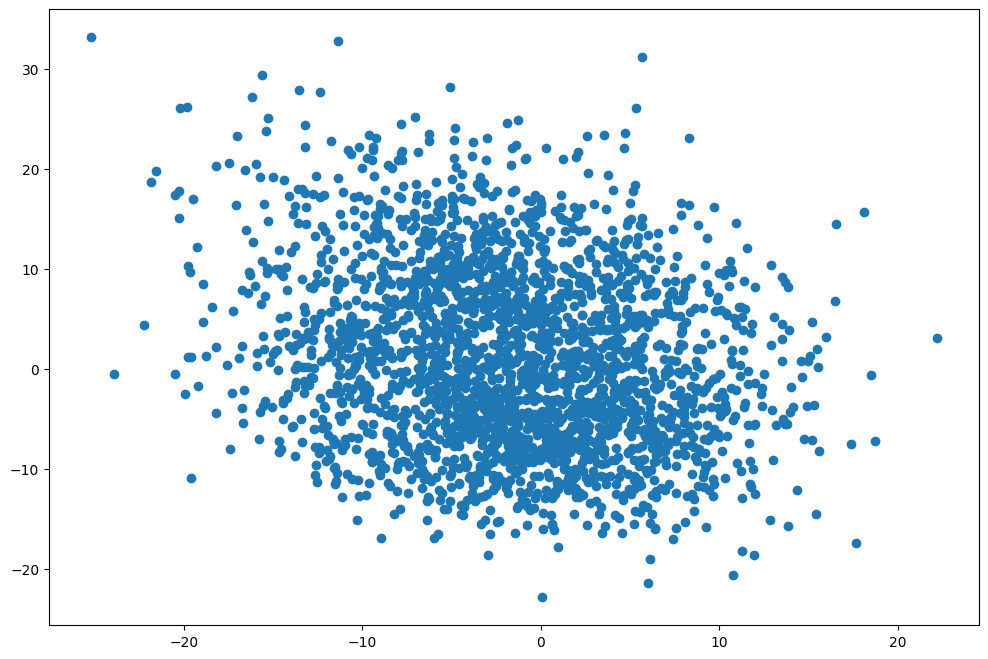

In [13511]:
plt.figure(figsize=(12,8))
plt.scatter(X['var_1'],X['var_2'])
plt.show()

In [13512]:
corr_dataset = pd.DataFrame(X) 

## correlation matrix

In [13513]:
corr_dataset.iloc[:,:-1].corr()

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15
var_1,1.000000,-0.221534,-0.312759,0.225296,-0.042796,0.097547,0.350128,-0.137781,0.132818,0.098559,-0.029945,-0.116535,-0.267010,0.026268,0.165908
var_2,-0.221534,1.000000,0.387806,-0.165516,-0.225760,-0.365172,-0.304595,0.446188,0.010724,0.031715,-0.376309,0.552585,0.586334,-0.326777,-0.132018
var_3,-0.312759,0.387806,1.000000,-0.272684,-0.257247,-0.292598,-0.294344,0.486379,-0.111133,0.121734,-0.017108,0.187486,0.333222,-0.263938,-0.032997
var_4,0.225296,-0.165516,-0.272684,1.000000,0.230163,0.042225,0.100379,-0.227079,0.261021,-0.079036,-0.268785,0.031617,-0.190580,0.081460,-0.005952
var_5,-0.042796,-0.225760,-0.257247,0.230163,1.000000,0.323396,-0.035655,-0.313475,0.080510,-0.252931,-0.126770,-0.069822,-0.288159,0.344952,-0.029055
var_6,0.097547,-0.365172,-0.292598,0.042225,0.323396,1.000000,0.254728,-0.228293,0.028938,-0.226974,0.281595,-0.368600,-0.339351,0.286189,0.037154
var_7,0.350128,-0.304595,-0.294344,0.100379,-0.035655,0.254728,1.000000,-0.158715,-0.004157,-0.132226,0.179018,-0.260609,-0.336297,-0.004985,0.272361
var_8,-0.137781,0.446188,0.486379,-0.227079,-0.313475,-0.228293,-0.158715,1.000000,0.064332,0.249632,-0.020378,0.247269,0.326096,-0.427636,-0.041503
var_9,0.132818,0.010724,-0.111133,0.261021,0.080510,0.028938,-0.004157,0.064332,1.000000,0.033578,-0.111239,0.074262,0.023042,-0.210759,-0.237796
var_10,0.098559,0.031715,0.121734,-0.079036,-0.252931,-0.226974,-0.132226,0.249632,0.033578,1.000000,0.071767,-0.014981,-0.008645,-0.132353,0.055550


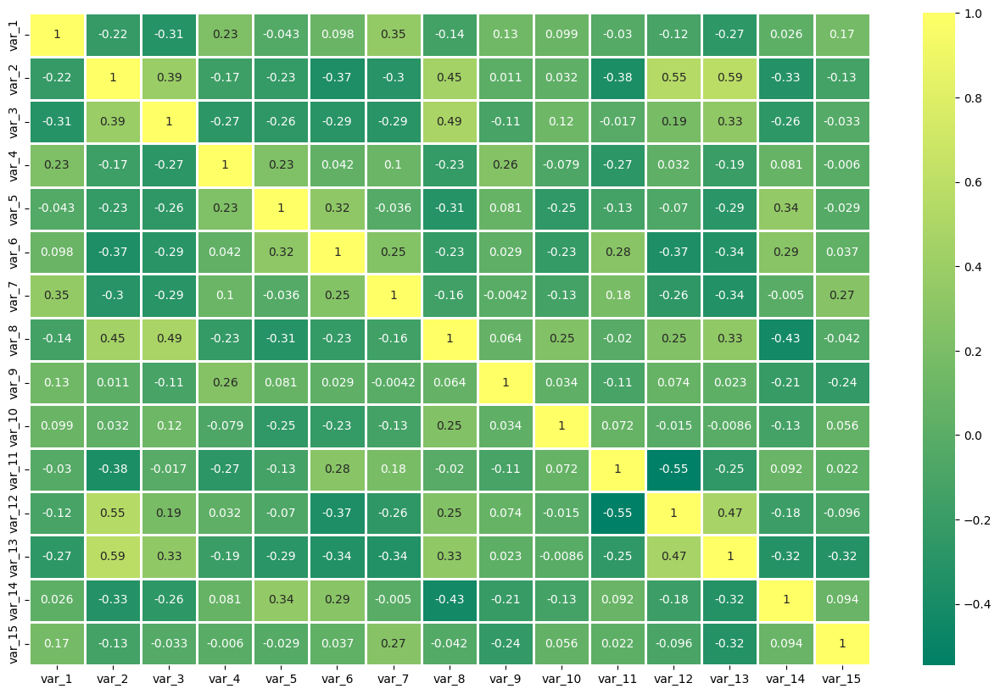

In [13514]:
plt.figure(figsize=(16,10))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='summer',annot=True,linewidths=1)
plt.show()

## data standardization

In [13515]:
X_values = corr_dataset.iloc[:,:-1].values

In [13516]:
y_values = corr_dataset.iloc[:,-1].values

In [13517]:
scaler = StandardScaler()

In [13518]:
X_values = scaler.fit_transform(X_values)

In [13519]:
np.mean(X_values),np.std(X_values)

(8.734938698277498e-17, 0.9999999999999999)

In [13520]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,0.033725,-0.604488,0.965339,-1.787979,1.213653,0.460086,-1.563410,-0.699996,0.167147,-0.286126,1.436410,-0.006066,0.934652,1.203282,-1.326910
1,0.028502,-1.118828,-0.082228,1.301612,-0.565692,1.801025,0.447026,0.446130,0.387389,0.632451,0.916208,-1.981618,-1.095379,-0.540668,0.991493
2,-0.354540,0.184952,0.510325,-0.599607,-0.176269,-1.618139,-0.007683,0.617767,0.917980,0.747732,-2.003686,1.627641,-0.371782,-1.179190,0.855275
3,-1.342955,1.188463,1.199394,0.944412,-0.392379,-1.031659,-0.675513,0.620868,0.540744,1.426161,-1.547352,0.746339,2.087348,-0.794069,-0.520570
4,-0.324473,-0.835247,-1.050013,-0.221186,-0.267295,0.765120,1.897098,1.036735,1.334014,1.004135,1.415147,-1.644480,-1.438550,-0.037147,1.201300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.013815,-1.006566,-1.095090,1.375376,0.682434,0.785652,-0.653086,-2.327435,1.063519,-2.027008,-1.432903,-1.098516,-1.165852,0.734721,-0.851327
2496,-0.660918,-0.453448,0.387551,-0.338419,0.776675,-0.647031,-1.150598,-0.109024,-1.190798,-0.280368,-0.036561,-0.261633,0.924774,0.249693,-0.860372
2497,1.517588,-1.049419,-1.547350,1.607487,1.806954,0.893435,0.120206,-0.444373,0.473828,-0.598907,-0.313767,0.183964,-0.781302,1.595162,0.017311
2498,-0.603335,-0.715823,0.437285,-0.935176,-0.368015,0.284523,-0.378332,0.579853,-1.115800,1.173067,0.980034,-0.583370,-0.324308,1.382284,0.862136


# dimensionality reduction algorithms

## pca 

In [13521]:
pca_general = PCA()

In [13522]:
pca_general.fit(X_values)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [13523]:
explained_variance = pca_general.explained_variance_ratio_

In [13524]:
explained_variance

array([0.25639975, 0.12999544, 0.10704177, 0.08586282, 0.07054844,
       0.05895361, 0.04818444, 0.03962592, 0.03581454, 0.0350212 ,
       0.03184205, 0.0280561 , 0.02573426, 0.02455022, 0.02236944])

In [13525]:
eigenvalues = pca_general.explained_variance_

In [13526]:
eigenvalues

array([3.84753532, 1.95071183, 1.60626901, 1.28845768, 1.05865004,
       0.88465797, 0.72305588, 0.59462663, 0.53743312, 0.52552816,
       0.47782184, 0.42100998, 0.38616842, 0.36840072, 0.33567582])

In [13527]:
eigenvalues[1]

1.9507118283646103

In [13528]:
selected_components = []

for i in eigenvalues:
    if i > 1:
        selected_components.append(i)
    
print(selected_components)

[3.8475353170570665, 1.9507118283646103, 1.6062690068943624, 1.2884576773696925, 1.0586500432534651]


In [13529]:
N_COMPONENTS = len(selected_components)

In [13530]:
eigenvectors = pca_general.components_

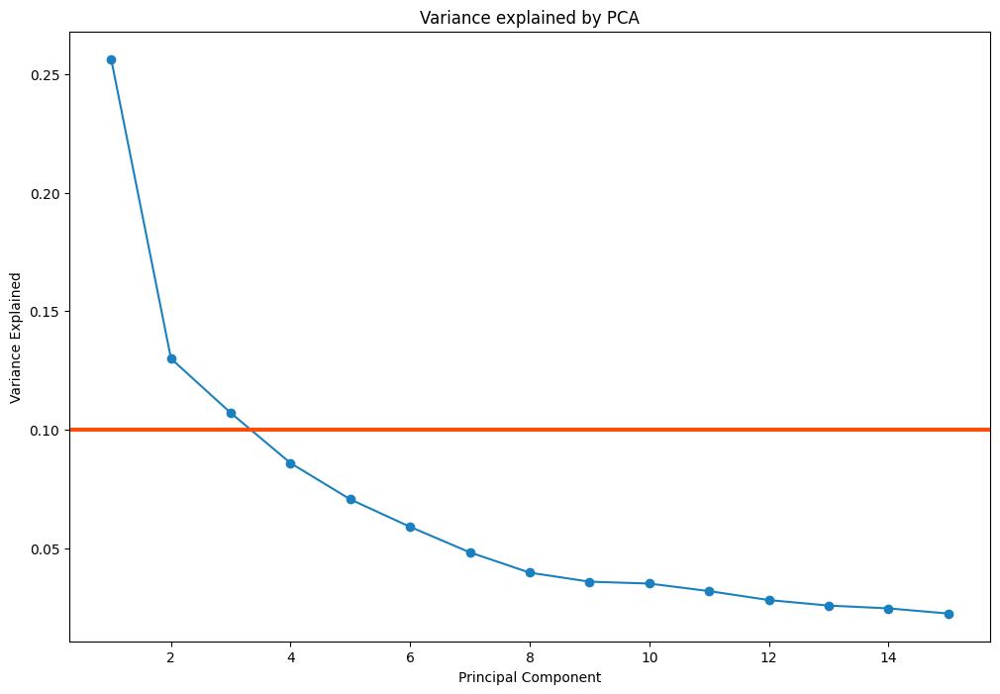

In [13531]:
plt.figure(figsize=(12,8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [13532]:
pca = PCA(n_components=N_COMPONENTS)

In [13533]:
X_pca = pca.fit_transform(X_values)

In [13534]:
pd.DataFrame(X_pca).head(8)

,0,1,2,3,4
0,-0.016489,0.446478,-2.649676,-1.324002,0.639864
1,-2.190737,1.469824,1.073186,-0.976217,0.156367
2,2.156264,-0.771284,1.442405,1.046236,0.475014
3,3.493331,-1.033735,0.301007,-0.263623,0.922366
4,-2.245829,2.040689,1.543792,-0.992089,-0.172613
5,-1.990724,-1.722455,-0.555757,0.244304,0.269063
6,-2.639345,1.217877,0.967866,-1.504919,-2.284295
7,-2.921055,-0.805903,0.415986,0.316768,0.550779


In [13535]:
pca_columns = [f'dim_{i+1}' for i in range(N_COMPONENTS)]

In [13536]:
pca_data = pd.DataFrame(X_pca, columns=pca_columns)

In [13537]:
pca_data = pd.concat([pca_data, corr_dataset[['target']]], axis=1)

In [13538]:
pca_data

,dim_1,dim_2,dim_3,dim_4,dim_5,target
0,-0.016489,0.446478,-2.649676,-1.324002,0.639864,1
1,-2.190737,1.469824,1.073186,-0.976217,0.156367,3
2,2.156264,-0.771284,1.442405,1.046236,0.475014,0
3,3.493331,-1.033735,0.301007,-0.263623,0.922366,0
4,-2.245829,2.040689,1.543792,-0.992089,-0.172613,3
...,...,...,...,...,...,...
2495,-2.917016,-2.873228,-0.321648,-0.695766,-0.104794,2
2496,0.663947,-0.074637,-1.825023,0.011921,0.607725,1
2497,-2.908704,-2.309661,0.262144,0.086717,0.443673,2
2498,-0.500651,2.169596,-1.029967,0.785787,1.226984,4


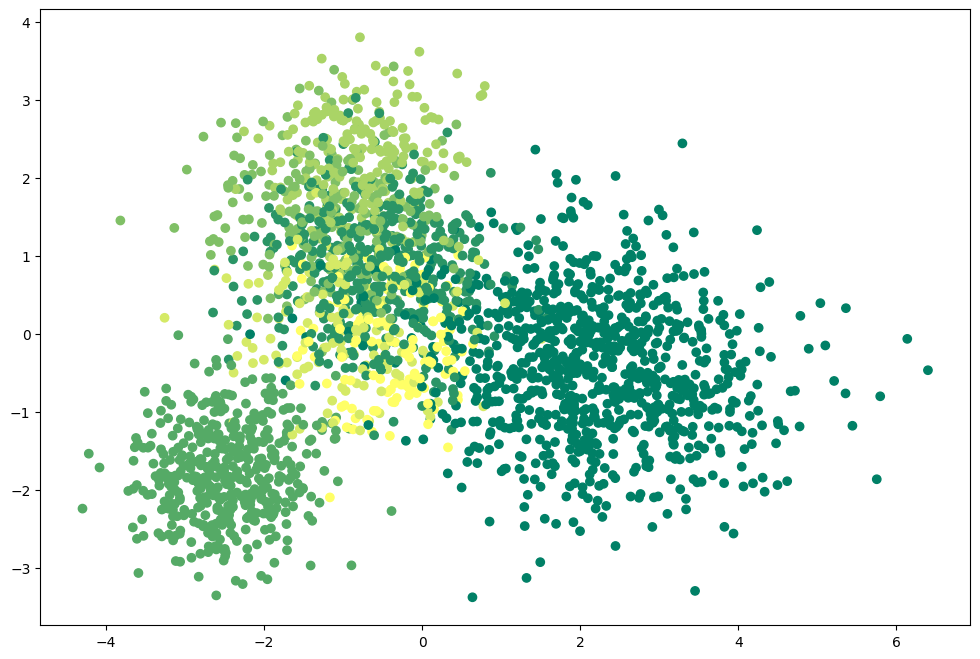

In [13539]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=pca_data['dim_1'],y=pca_data['dim_2'],c=pca_data['target'],cmap='summer')
plt.show()

## t-SNE

In [13540]:
tsne = TSNE(n_components=3,random_state=42)

In [13541]:
X_tsne = tsne.fit_transform(X_values)

In [13542]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [13543]:
tsne_data

,dim_1,dim_2,dim_3,target
0,1.770720,5.617645,-20.158386,1
1,-1.973435,10.383119,9.306715,3
2,12.059163,-5.290607,8.223711,0
3,19.979900,-4.822046,3.762452,0
4,-3.261574,19.512556,17.288675,3
...,...,...,...,...
2495,-18.783590,-19.258865,-0.586902,2
2496,5.207478,6.544472,-8.066565,1
2497,-17.702293,-10.376842,7.636367,2
2498,-4.399291,25.341936,-10.271235,4


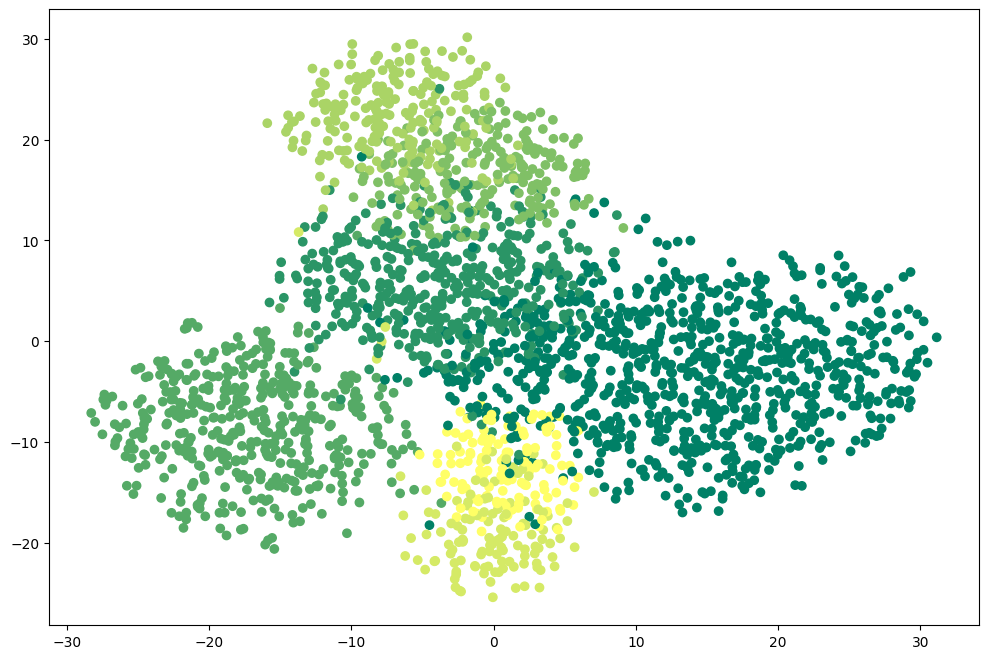

In [13544]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'],cmap='summer')
plt.show()

In [13545]:
tsne.kl_divergence_

1.583583950996399

## umap

In [13546]:
umap = umap.UMAP(n_components=3,random_state=42)

In [13547]:
X_umap = umap.fit_transform(X_values)

In [13548]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [13549]:
umap_data

,dim_1,dim_2,dim_3,target
0,3.025711,6.441599,6.266489,1
1,3.911280,9.575749,10.363535,3
2,-0.061377,-0.802045,8.036317,0
3,-1.327168,-0.623793,8.342809,0
4,3.687812,9.924694,10.346849,3
...,...,...,...,...
2495,10.159852,2.834949,9.014123,2
2496,2.809786,6.405619,6.257440,1
2497,10.795490,3.211650,9.513768,2
2498,1.597360,8.913066,5.895241,4


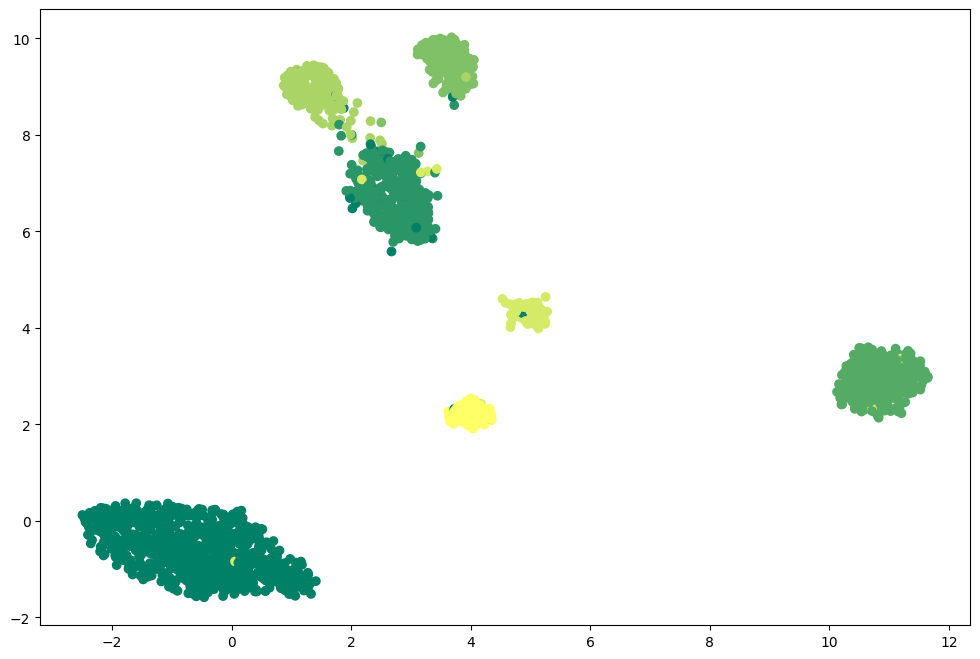

In [13550]:
fig = plt.figure(figsize=(12,8))
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'],cmap='summer')
plt.show()

# clustering algorithms

## k-means 

In [13551]:
kmeans = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [13552]:
kmeans.fit(X_values)

,n_clusters,7
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [13553]:
df_kmeans = corr_dataset.copy()

In [13554]:
df_kmeans['k_means'] = kmeans.labels_

In [13555]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,k_means
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,0
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,4
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,1
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,2
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,3
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,0
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,3
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,5


In [13556]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.0532
accuracy after: 0.7628


In [13557]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,k_means
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,5
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


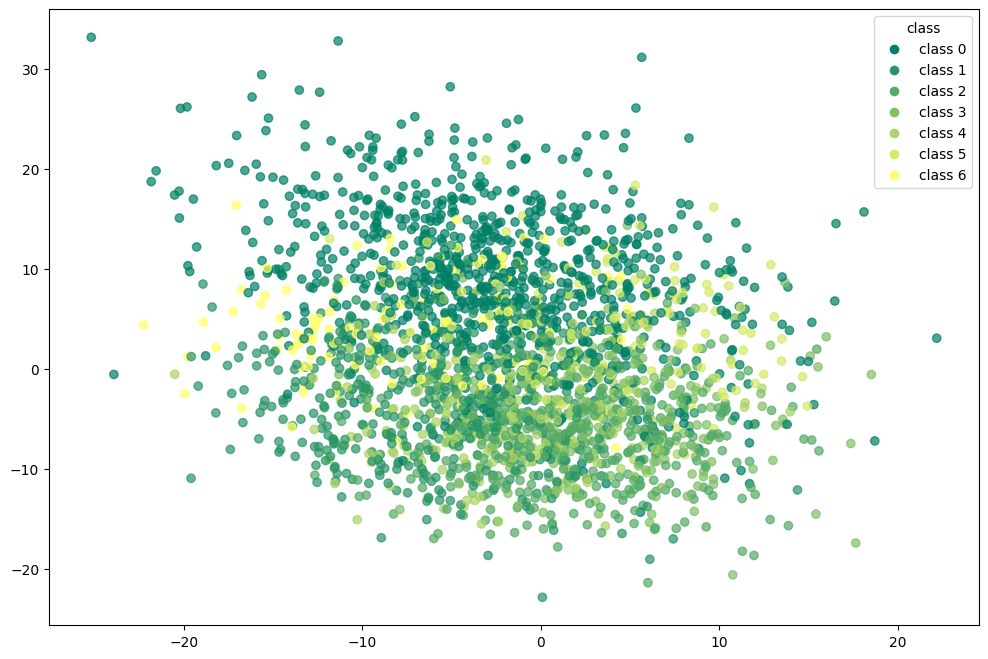

In [13558]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

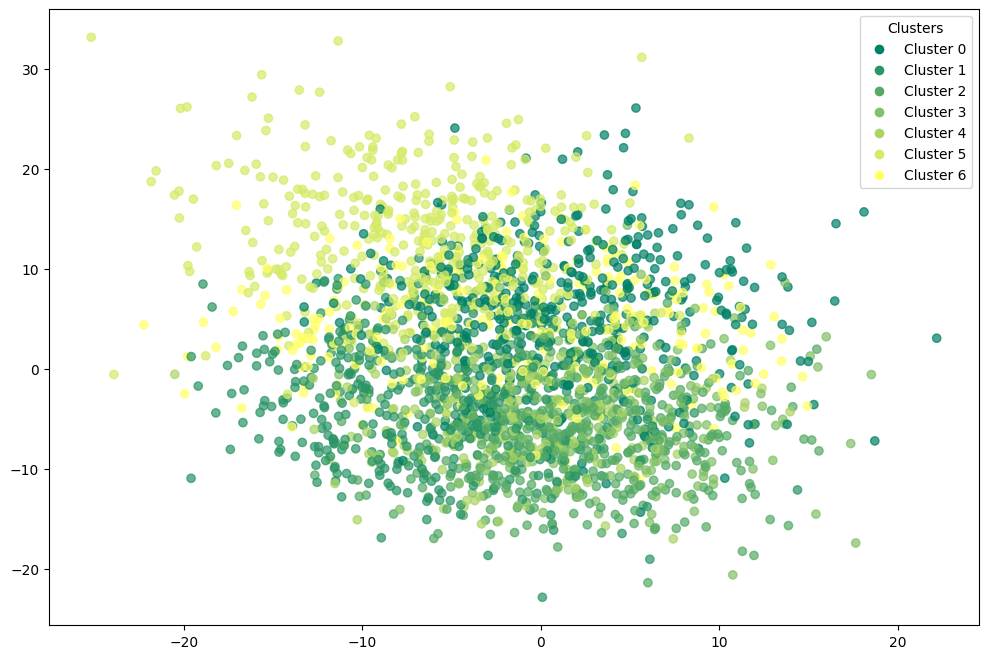

In [13559]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13560]:
kmeans.cluster_centers_

array([[-0.67928371, -0.49708033, -0.00406437, -0.54272642, -0.1810078 ,
         0.2003083 , -0.3222806 , -0.64213749, -0.30656566, -0.31119895,
         0.9420345 , -0.79881178,  0.16568278,  0.2160056 , -0.6669351 ],
       [ 0.44090141,  0.50697401,  0.12898264,  0.34523268, -0.82429338,
        -1.12546814, -0.02372361,  0.30087152,  0.32367015,  0.60542724,
        -0.61380496,  0.61875643,  0.47336322, -0.81994993,  0.11525851],
       [-0.71063507,  1.32026646,  0.93279455, -0.30698612, -0.13208027,
        -0.55529477, -0.98683821,  1.04296277,  0.18540091,  0.05584173,
        -0.76437578,  1.18305245,  1.20795147, -0.50657188, -0.70513815],
       [ 0.55424673, -0.87231481, -1.15500092,  1.02727317,  1.35084406,
         0.70058858,  0.1665046 , -1.0940146 ,  0.53642391, -0.37766057,
        -0.47655942, -0.17535926, -0.95420966,  0.9086053 , -0.08639118],
       [ 0.6775451 , -0.51704611, -0.0805308 , -0.14929197, -0.36082997,
         1.04942461,  1.37297088,  0.89753784, 

In [13561]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[457   6   3   3   2 419  10]
 [  1 432   1   2   6   1   7]
 [  0   1 447   0   0   0   2]
 [  0   0   0 225   0   0   0]
 [  0   3   0   1 221   0   0]
 [  2   3   1   0   0   0 119]
 [  0   0   0   0   0   0 125]]


In [13562]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.99      0.51      0.67       900
           1       0.97      0.96      0.97       450
           2       0.99      0.99      0.99       450
           3       0.97      1.00      0.99       225
           4       0.97      0.98      0.97       225
           5       0.00      0.00      0.00       125
           6       0.48      1.00      0.64       125

    accuracy                           0.76      2500
   macro avg       0.77      0.78      0.75      2500
weighted avg       0.91      0.76      0.80      2500



In [13563]:
adjusted_rand_score(df_kmeans['target'],df_kmeans['k_means'])

0.7295373898745849

In [13564]:
normalized_mutual_info_score(df_kmeans['target'],df_kmeans['k_means'])

0.8466890715277721

In [13565]:
silhouette_score(df_kmeans.drop(columns=['target','k_means']).values,df_kmeans['k_means'])

0.19138688993906686

### k-means with pca

In [13566]:
kmeans_pca = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [13567]:
kmeans_pca.fit(X_pca)

,n_clusters,7
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [13568]:
df_pca_kmeans = corr_dataset.copy()

In [13569]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [13570]:
df_pca_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,kmeans_pca
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,6
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,4
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,2
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,5
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,5
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,0


In [13571]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.158
accuracy after: 0.7376


In [13572]:
df_pca_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,kmeans_pca
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,5
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


In [13573]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[445   3   2   3   5 434   8]
 [  0 388   5  17  32   1   7]
 [  0   1 447   0   0   0   2]
 [  0   2   0 223   0   0   0]
 [  0   6   0   1 218   0   0]
 [  3   3   2   2   1   0 114]
 [  1   1   0   0   0   0 123]]


In [13574]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.99      0.49      0.66       900
           1       0.96      0.86      0.91       450
           2       0.98      0.99      0.99       450
           3       0.91      0.99      0.95       225
           4       0.85      0.97      0.91       225
           5       0.00      0.00      0.00       125
           6       0.48      0.98      0.65       125

    accuracy                           0.74      2500
   macro avg       0.74      0.76      0.72      2500
weighted avg       0.89      0.74      0.78      2500



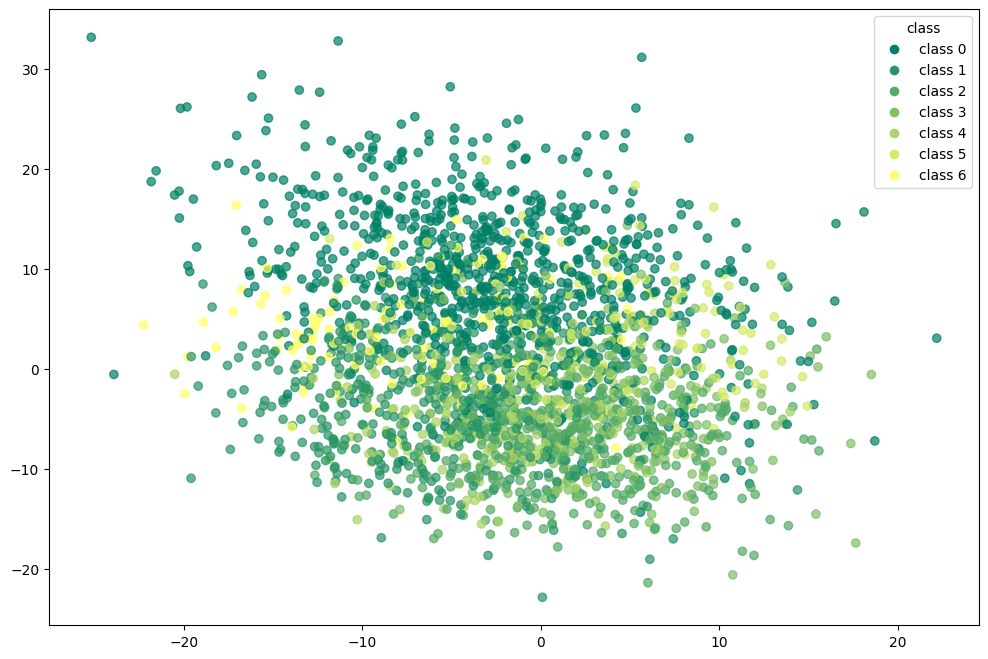

In [13575]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

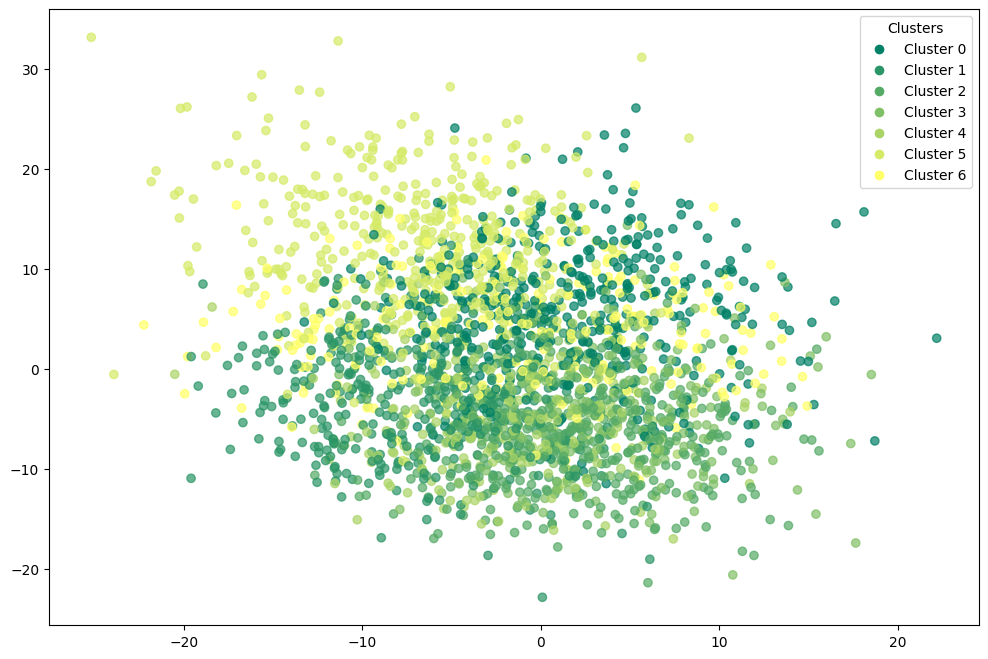

In [13576]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13577]:
adjusted_rand_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.6963524439633998

In [13578]:
normalized_mutual_info_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.8048401417591283

In [13579]:
silhouette_score(df_pca_kmeans.drop(columns=['target','kmeans_pca']).values,df_pca_kmeans['kmeans_pca'])

0.18291985987839257

### k-means with t-SNE

In [13580]:
kmeans_tsne = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [13581]:
kmeans_tsne.fit(X_tsne)

,n_clusters,7
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [13582]:
df_tsne_kmeans = corr_dataset.copy()

In [13583]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [13584]:
df_tsne_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,kmeans_tsne
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,0
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,1
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,6
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,0
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,5


In [13585]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.2732
accuracy after: 0.7484


In [13586]:
df_tsne_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,kmeans_tsne
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,5
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,0
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


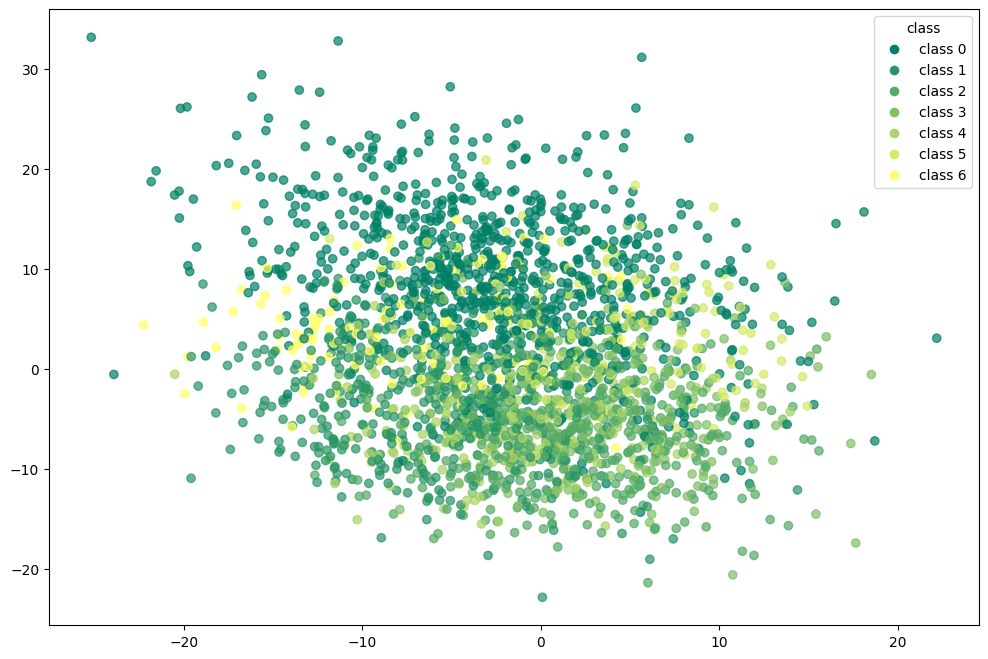

In [13587]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

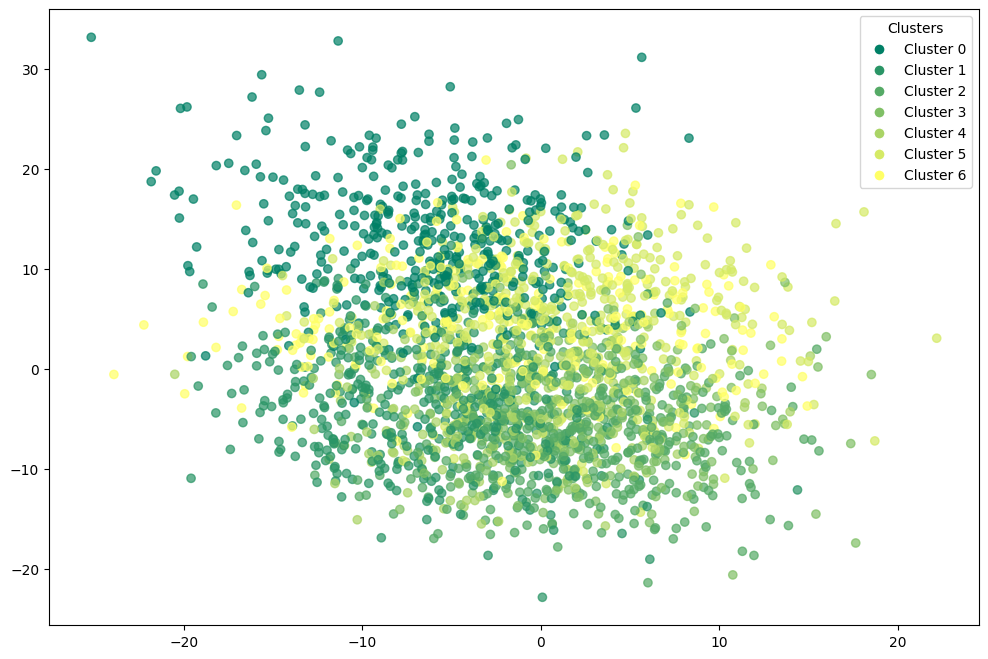

In [13588]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13589]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[442  11   2   9   1 422  13]
 [  0 414   6  12  11   3   4]
 [  0   1 446   0   0   0   3]
 [  0   0   0 223   2   0   0]
 [  0   4   0   1 220   0   0]
 [  0   4   0   0   0   1 120]
 [  0   0   0   0   0   0 125]]


In [13590]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.49      0.66       900
           1       0.95      0.92      0.94       450
           2       0.98      0.99      0.99       450
           3       0.91      0.99      0.95       225
           4       0.94      0.98      0.96       225
           5       0.00      0.01      0.00       125
           6       0.47      1.00      0.64       125

    accuracy                           0.75      2500
   macro avg       0.75      0.77      0.73      2500
weighted avg       0.90      0.75      0.79      2500



In [13591]:
adjusted_rand_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.7042100572564606

In [13592]:
normalized_mutual_info_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.8181111612996705

In [13593]:
silhouette_score(df_tsne_kmeans.drop(columns=['target','kmeans_tsne']).values,df_tsne_kmeans['kmeans_tsne'])

0.18125686547418055

### k-means with umap

In [13594]:
kmeans_umap = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [13595]:
kmeans_umap.fit(X_umap)

,n_clusters,7
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [13596]:
df_umap_kmeans = corr_dataset.copy()

In [13597]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [13598]:
df_umap_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,kmeans_umap
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,0
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,1
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,1
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,0
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,5


In [13599]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.2748
accuracy after: 0.9804


In [13600]:
df_umap_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,kmeans_umap
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,0
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


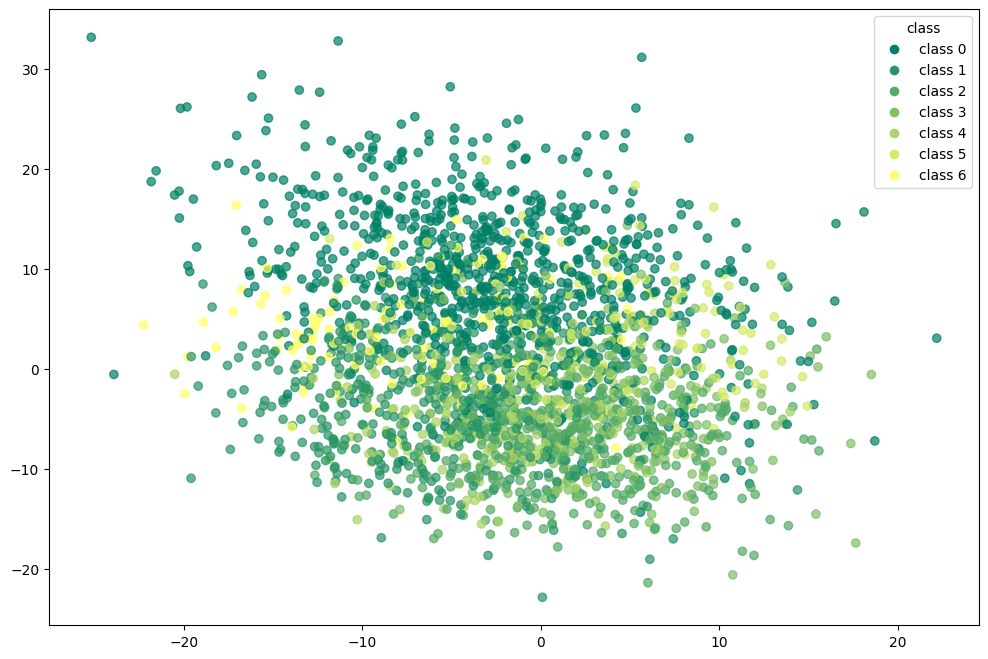

In [13601]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

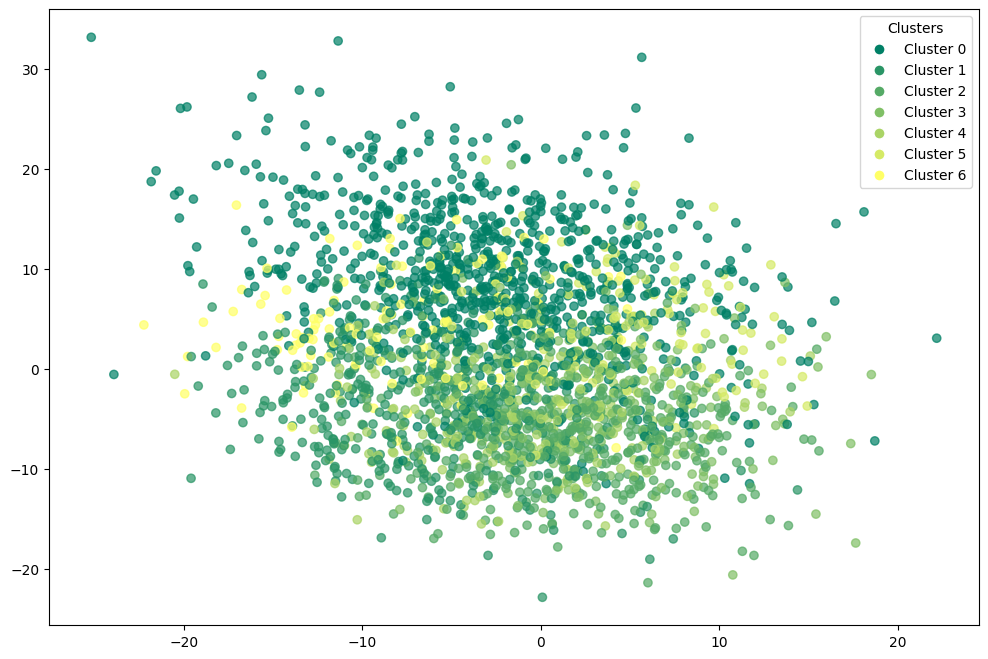

In [13602]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13603]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[879  14   0   3   1   2   1]
 [  2 440   2   2   4   0   0]
 [  0   1 449   0   0   0   0]
 [  0   1   0 222   2   0   0]
 [  0   4   0   1 220   0   0]
 [  1   4   2   0   0 116   2]
 [  0   0   0   0   0   0 125]]


In [13604]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       900
           1       0.95      0.98      0.96       450
           2       0.99      1.00      0.99       450
           3       0.97      0.99      0.98       225
           4       0.97      0.98      0.97       225
           5       0.98      0.93      0.95       125
           6       0.98      1.00      0.99       125

    accuracy                           0.98      2500
   macro avg       0.98      0.98      0.98      2500
weighted avg       0.98      0.98      0.98      2500



In [13605]:
adjusted_rand_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.957205714767852

In [13606]:
normalized_mutual_info_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.9364216613784037

In [13607]:
silhouette_score(df_umap_kmeans.drop(columns=['target','kmeans_umap']).values,df_umap_kmeans['kmeans_umap'])

0.20768570248072787

## Birch

In [13608]:
birch = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [13609]:
birch.fit(X_values)

,threshold,1.5
,branching_factor,50
,n_clusters,7
,compute_labels,True
,copy,'deprecated'


In [13610]:
df_birch = corr_dataset.copy()

In [13611]:
df_birch['birch'] = birch.labels_

In [13612]:
df_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,birch
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,4
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,1
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,1
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,5
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,4
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,5
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,6


In [13613]:
y_true = df_birch['target'].values  
y_kmeans = df_birch['birch'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_birch['birch'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_birch['birch'] == y_true))

accuracy before: 0.0948
accuracy after: 0.8288


In [13614]:
df_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,birch
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,0
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


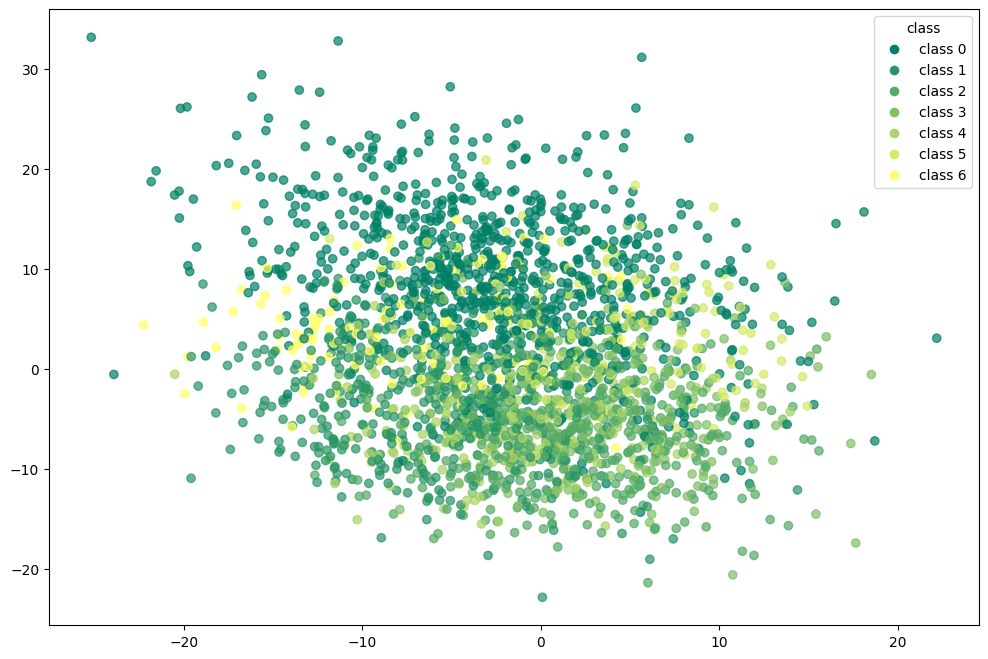

In [13615]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

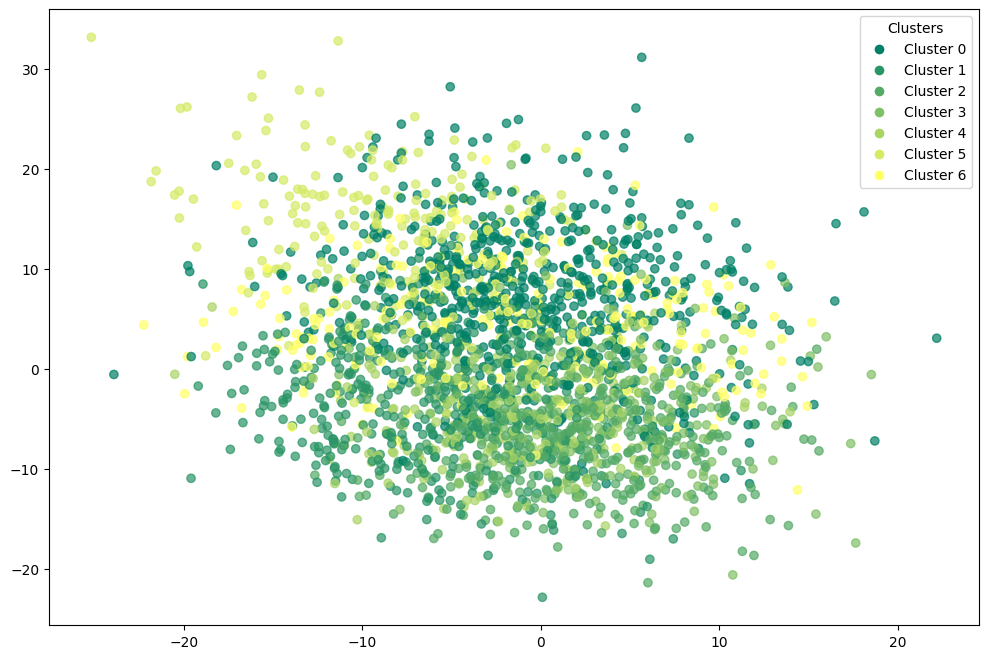

In [13616]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['birch'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_birch['birch'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13617]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[657  16   0   4   0 218   5]
 [  6 416   3   2  18   1   4]
 [  0   3 442   0   0   0   5]
 [  0   5   0 217   2   0   1]
 [  0   7   0   1 217   0   0]
 [  3   3   2   0   0   0 117]
 [  2   0   0   0   0   0 123]]


In [13618]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       0.98      0.73      0.84       900
           1       0.92      0.92      0.92       450
           2       0.99      0.98      0.99       450
           3       0.97      0.96      0.97       225
           4       0.92      0.96      0.94       225
           5       0.00      0.00      0.00       125
           6       0.48      0.98      0.65       125

    accuracy                           0.83      2500
   macro avg       0.75      0.79      0.76      2500
weighted avg       0.89      0.83      0.85      2500



In [13619]:
adjusted_rand_score(df_birch['target'],df_birch['birch'])

0.7578805005734176

In [13620]:
normalized_mutual_info_score(df_birch['target'],df_birch['birch'])

0.8213208169319064

In [13621]:
silhouette_score(df_birch.drop(columns=['target','birch']).values,df_birch['birch'])

0.17250814175494028

### Birch with pca

In [13622]:
birch_pca = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [13623]:
birch_pca.fit(X_pca)

,threshold,1.5
,branching_factor,50
,n_clusters,7
,compute_labels,True
,copy,'deprecated'


In [13624]:
df_pca_birch = corr_dataset.copy()

In [13625]:
df_pca_birch["birch_pca"] = birch_pca.labels_

In [13626]:
df_pca_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,birch_pca
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,0
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,5
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,3
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,1
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,0
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,0
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,0


In [13627]:
y_true = df_pca_birch['target'].values  
y_kmeans = df_pca_birch['birch_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_birch['birch_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_birch['birch_pca'] == y_true))

accuracy before: 0.0592
accuracy after: 0.4828


In [13628]:
df_pca_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,birch_pca
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,2
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,1
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,2


In [13629]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[407 408   9   2  57  11   6]
 [  1  16 410  10   0   0  13]
 [  0   1 447   0   0   1   1]
 [  0   0   8 215   0   2   0]
 [  1   0 223   1   0   0   0]
 [  3   0  13   0   0   0 109]
 [  0   0   3   0   0   0 122]]


In [13630]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       0.99      0.45      0.62       900
           1       0.04      0.04      0.04       450
           2       0.40      0.99      0.57       450
           3       0.94      0.96      0.95       225
           4       0.00      0.00      0.00       225
           5       0.00      0.00      0.00       125
           6       0.49      0.98      0.65       125

    accuracy                           0.48      2500
   macro avg       0.41      0.49      0.40      2500
weighted avg       0.54      0.48      0.45      2500



In [13631]:
adjusted_rand_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.3950411966460841

In [13632]:
normalized_mutual_info_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.6271444732662469

In [13633]:
silhouette_score(df_pca_birch.drop(columns=['target','birch_pca']).values,df_pca_birch['birch_pca'])

0.09495050082331892

### Birch with t-SNE

In [13634]:
birch_tsne = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [13635]:
birch_tsne.fit(X_tsne)

,threshold,1.5
,branching_factor,50
,n_clusters,7
,compute_labels,True
,copy,'deprecated'


In [13636]:
df_tsne_birch = corr_dataset.copy()

In [13637]:
df_tsne_birch['birch_tsne'] = birch_tsne.labels_

In [13638]:
df_tsne_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,birch_tsne
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,4
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,5
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,3
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,3
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,6


In [13639]:
y_true = df_tsne_birch['target'].values  
y_kmeans = df_tsne_birch['birch_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_birch['birch_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_birch['birch_tsne'] == y_true))

accuracy before: 0.3804
accuracy after: 0.7848


In [13640]:
df_tsne_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,birch_tsne
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,5
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


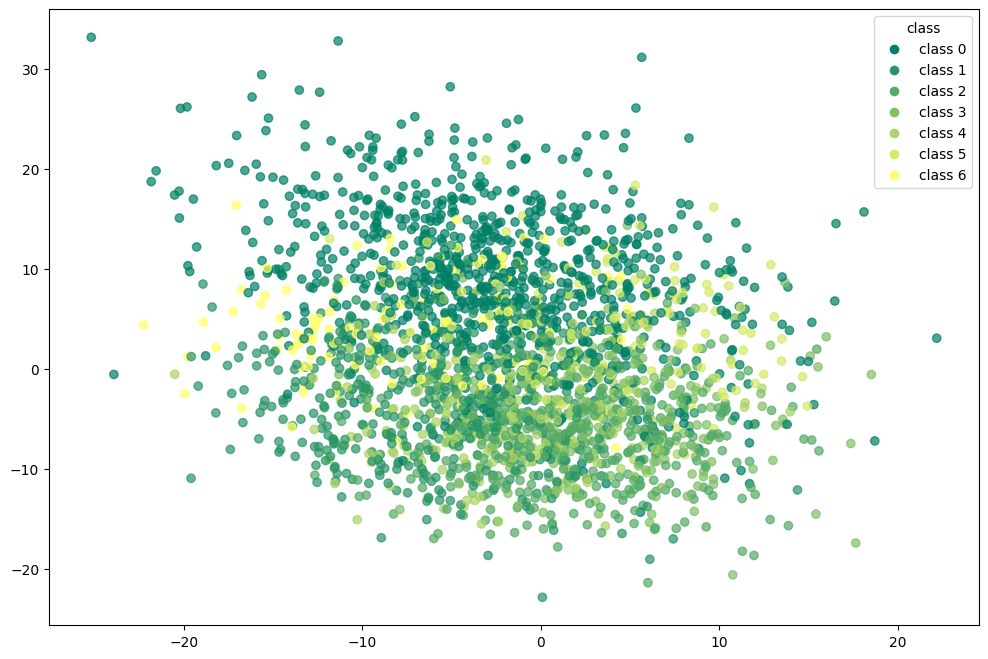

In [13641]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

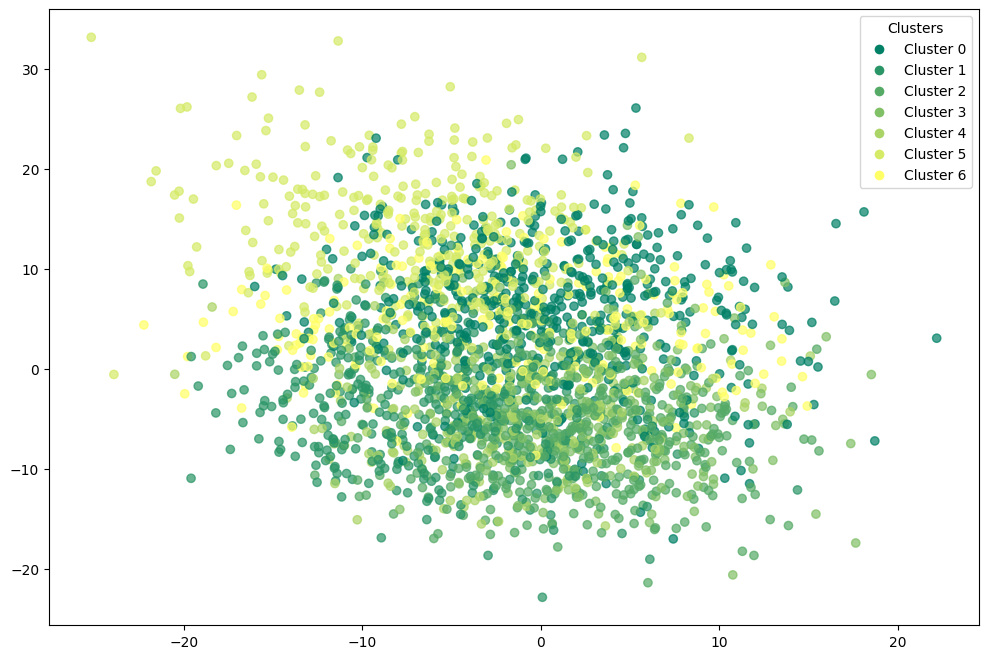

In [13642]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['birch_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_birch['birch_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13643]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne']))

[[535  12   0   4   1 343   5]
 [  5 415   4   7  15   0   4]
 [  0   1 449   0   0   0   0]
 [  1   1   0 221   2   0   0]
 [  0   7   0   1 217   0   0]
 [  1   4   4   0   0   0 116]
 [  0   0   0   0   0   0 125]]


In [13644]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       0.99      0.59      0.74       900
           1       0.94      0.92      0.93       450
           2       0.98      1.00      0.99       450
           3       0.95      0.98      0.97       225
           4       0.92      0.96      0.94       225
           5       0.00      0.00      0.00       125
           6       0.50      1.00      0.67       125

    accuracy                           0.78      2500
   macro avg       0.75      0.78      0.75      2500
weighted avg       0.90      0.78      0.82      2500



In [13645]:
adjusted_rand_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.7234904898147141

In [13646]:
normalized_mutual_info_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.8273659938098167

In [13647]:
silhouette_score(df_tsne_birch.drop(columns=['target','birch_tsne']).values,df_tsne_birch['birch_tsne'])

0.1780851508923959

### Birch with umap

In [13648]:
birch_umap = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [13649]:
birch_umap.fit(X_umap)

,threshold,1.5
,branching_factor,50
,n_clusters,7
,compute_labels,True
,copy,'deprecated'


In [13650]:
df_umap_birch = corr_dataset.copy()

In [13651]:
df_umap_birch['birch_umap'] = birch_umap.labels_

In [13652]:
df_umap_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,birch_umap
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,0
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,1
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,2
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,2
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,3
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,0
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,3
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,0


In [13653]:
y_true = df_umap_birch['target'].values  
y_kmeans = df_umap_birch['birch_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_birch['birch_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_birch['birch_umap'] == y_true))

accuracy before: 0.0076
accuracy after: 0.894


In [13654]:
df_umap_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,birch_umap
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,0
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,1


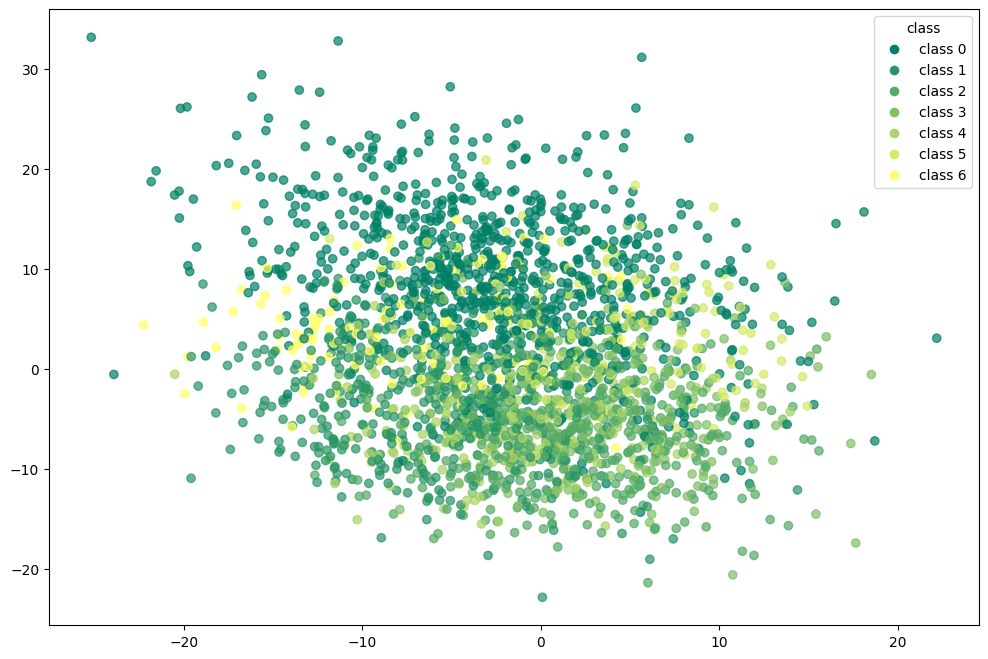

In [13655]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

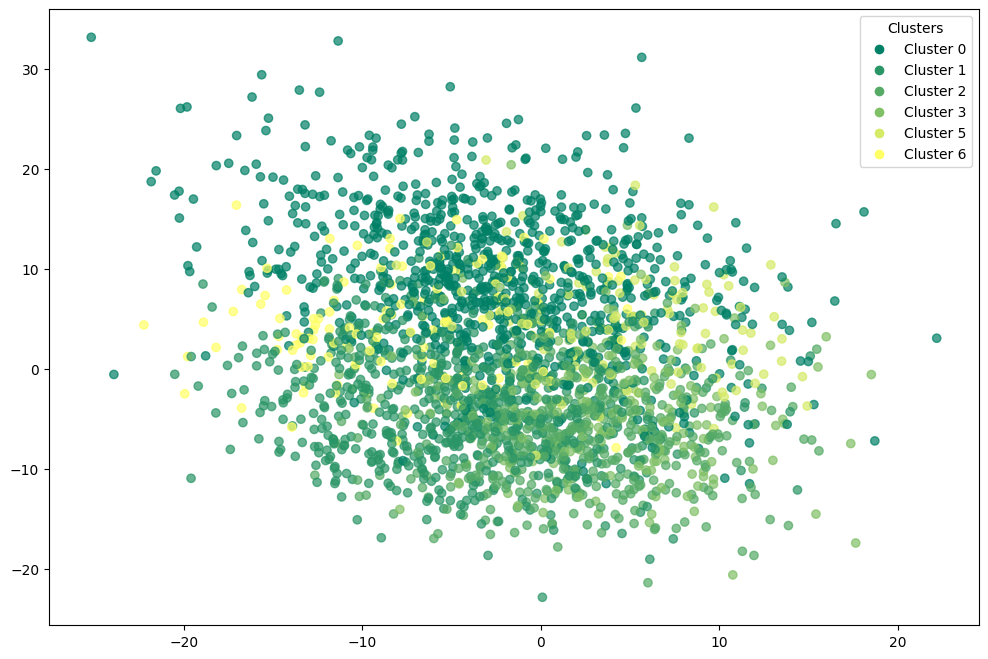

In [13656]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['birch_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_birch['birch_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13657]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap']))

[[879  15   0   3   0   2   1]
 [  2 444   2   2   0   0   0]
 [  0   1 449   0   0   0   0]
 [  0   3   0 222   0   0   0]
 [  0 224   0   1   0   0   0]
 [  1   4   2   0   0 116   2]
 [  0   0   0   0   0   0 125]]


In [13658]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       900
           1       0.64      0.99      0.78       450
           2       0.99      1.00      0.99       450
           3       0.97      0.99      0.98       225
           4       0.00      0.00      0.00       225
           5       0.98      0.93      0.95       125
           6       0.98      1.00      0.99       125

    accuracy                           0.89      2500
   macro avg       0.79      0.84      0.81      2500
weighted avg       0.84      0.89      0.86      2500



In [13659]:
adjusted_rand_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.8694984560678582

In [13660]:
normalized_mutual_info_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.8912975697756105

In [13661]:
silhouette_score(df_umap_birch.drop(columns=['target','birch_umap']).values,df_umap_birch['birch_umap'])

0.19952456147200046

## GMM - Gaussian Mixture Models

In [13662]:
gmm = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [13663]:
gmm.fit(X_values)

,n_components,7
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [13664]:
df_gmm = corr_dataset.copy()

In [13665]:
df_gmm['gmm'] = gmm.predict(X_values)

In [13666]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,gmm
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,0
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,4
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,1
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,2
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,3
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,0
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,3
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,6


In [13667]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.004
accuracy after: 0.8892


In [13668]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,gmm
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,5
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


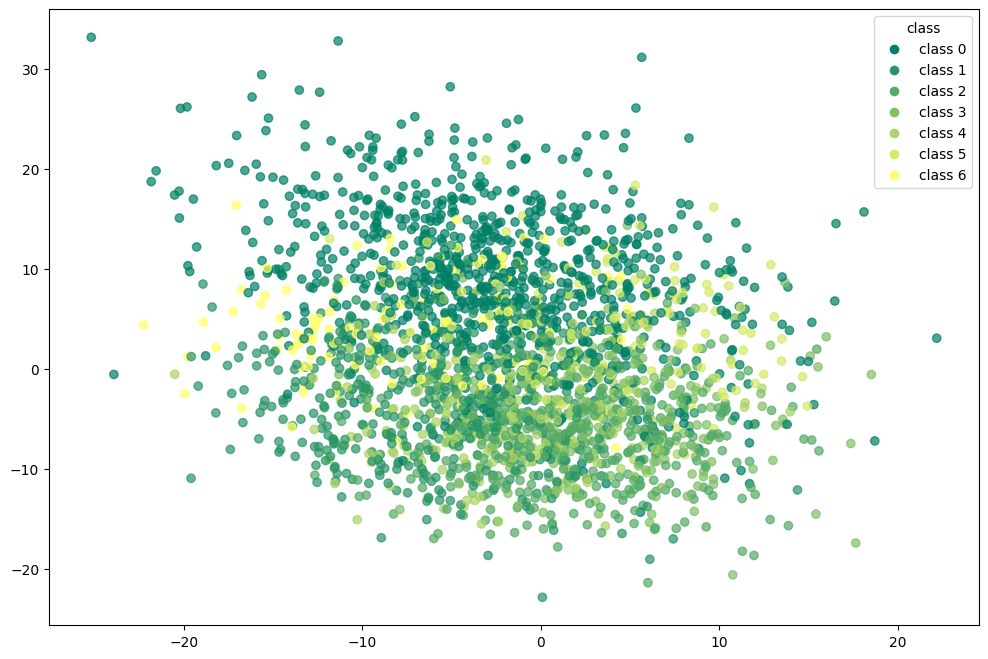

In [13669]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

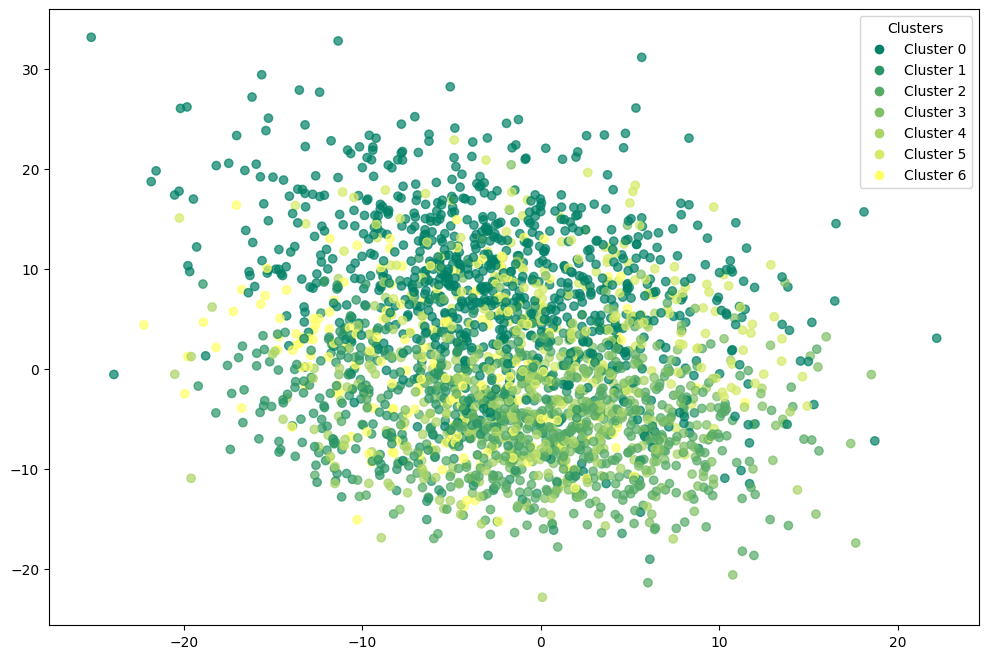

In [13670]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13671]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[826   4   0   3   1  66   0]
 [  3 338   0   2 105   1   1]
 [  0   0 449   0   1   0   0]
 [  0   0   0 224   1   0   0]
 [  0   0   0   1 143   0  81]
 [  0   4   0   0   0 119   2]
 [  0   1   0   0   0   0 124]]


In [13672]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      0.92      0.96       900
           1       0.97      0.75      0.85       450
           2       1.00      1.00      1.00       450
           3       0.97      1.00      0.98       225
           4       0.57      0.64      0.60       225
           5       0.64      0.95      0.77       125
           6       0.60      0.99      0.74       125

    accuracy                           0.89      2500
   macro avg       0.82      0.89      0.84      2500
weighted avg       0.91      0.89      0.89      2500



In [13673]:
adjusted_rand_score(df_gmm['target'],df_gmm['gmm'])

0.8472191385199982

In [13674]:
normalized_mutual_info_score(df_gmm['target'],df_gmm['gmm'])

0.8463111078854934

In [13675]:
silhouette_score(df_gmm.drop(columns=['target','gmm']).values,df_gmm['gmm'])

0.1581152388901628

### GMM with pca

In [13676]:
gmm_pca = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [13677]:
gmm_pca.fit(X_pca)

,n_components,7
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [13678]:
df_pca_gmm = corr_dataset.copy()

In [13679]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [13680]:
df_pca_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,gmm_pca
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,0
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,6
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,4
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,4
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,5
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,0
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,5
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,6


In [13681]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.0032
accuracy after: 0.6816


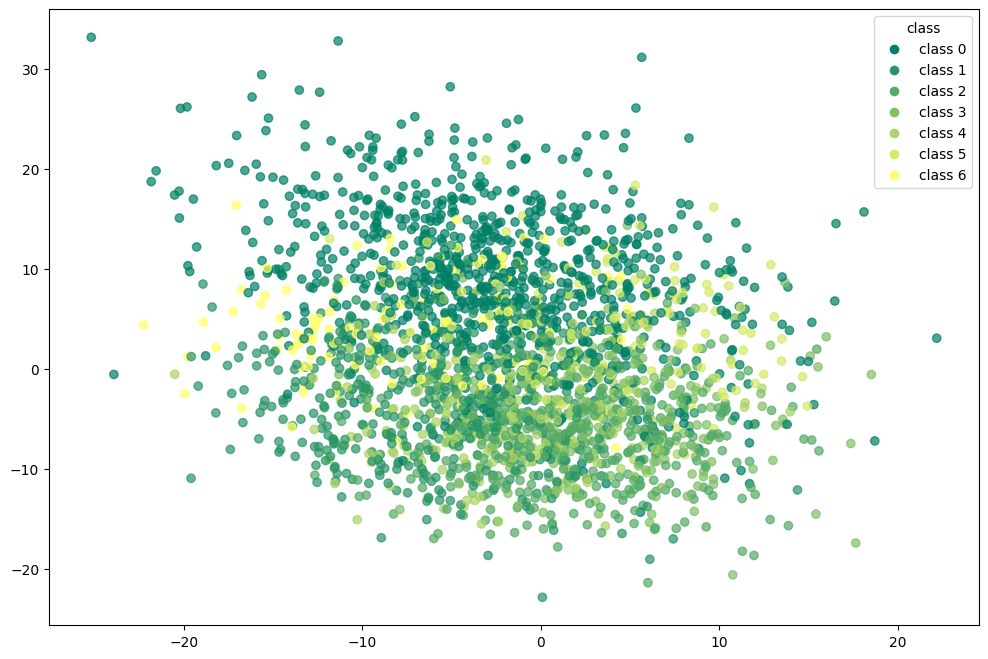

In [13682]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

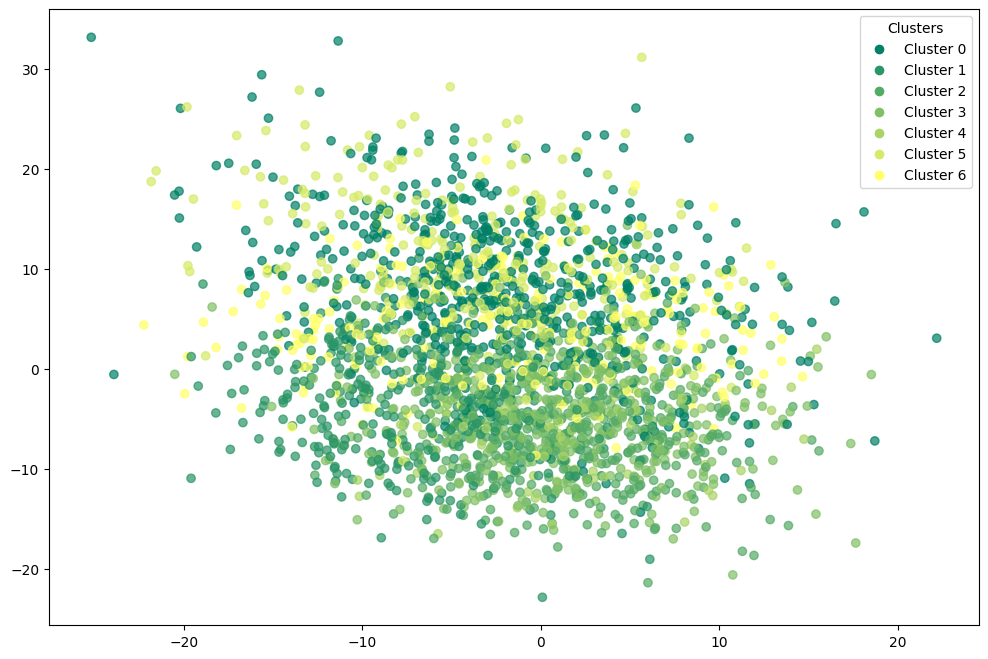

In [13683]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13684]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[597   3   0   5   1 290   4]
 [  2 379   1  61   4   0   3]
 [  0   1 377   0  70   0   2]
 [  0   0   0 225   0   0   0]
 [  0   5   0 220   0   0   0]
 [  3   2   1   4   0   3 112]
 [  1   1   0   0   0   0 123]]


In [13685]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.99      0.66      0.79       900
           1       0.97      0.84      0.90       450
           2       0.99      0.84      0.91       450
           3       0.44      1.00      0.61       225
           4       0.00      0.00      0.00       225
           5       0.01      0.02      0.01       125
           6       0.50      0.98      0.67       125

    accuracy                           0.68      2500
   macro avg       0.56      0.62      0.56      2500
weighted avg       0.77      0.68      0.70      2500



In [13686]:
adjusted_rand_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.6420291879874644

In [13687]:
normalized_mutual_info_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.7617008979358686

In [13688]:
silhouette_score(df_pca_gmm.drop(columns=['target','gmm_pca']).values,df_pca_gmm['gmm_pca'])

0.08016015363693245

### GMM with t-SNE

In [13689]:
gmm_tsne = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [13690]:
gmm_tsne.fit(X_tsne)

,n_components,7
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [13691]:
df_tsne_gmm = corr_dataset.copy()

In [13692]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [13693]:
df_tsne_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,gmm_tsne
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,0
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,1
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,6
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,0
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,5


In [13694]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.2752
accuracy after: 0.7556


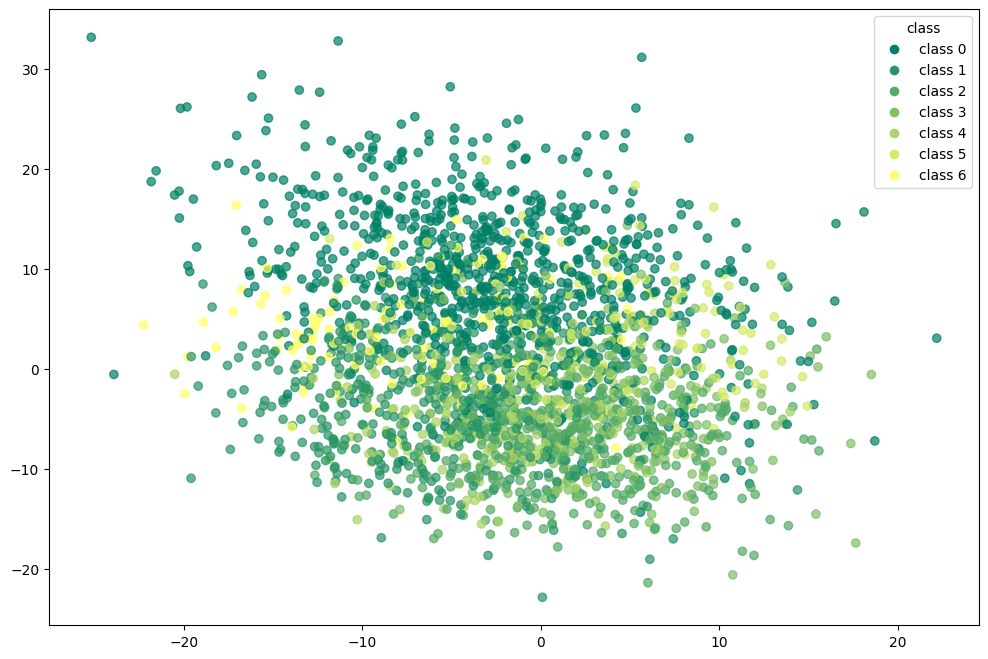

In [13695]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

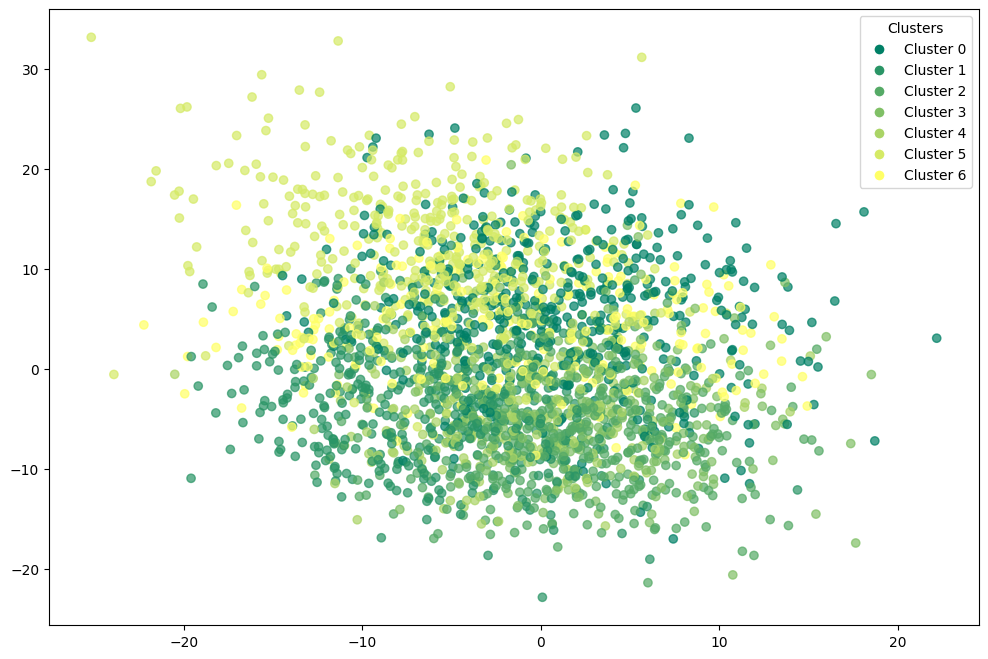

In [13696]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13697]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[451  13   0   3   1 428   4]
 [  6 431   4   4   2   0   3]
 [  0   1 448   0   0   0   1]
 [  1   2   0 221   1   0   0]
 [  0  11   0   1 213   0   0]
 [  1   4   2   0   0   0 118]
 [  0   0   0   0   0   0 125]]


In [13698]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.98      0.50      0.66       900
           1       0.93      0.96      0.95       450
           2       0.99      1.00      0.99       450
           3       0.97      0.98      0.97       225
           4       0.98      0.95      0.96       225
           5       0.00      0.00      0.00       125
           6       0.50      1.00      0.66       125

    accuracy                           0.76      2500
   macro avg       0.76      0.77      0.74      2500
weighted avg       0.90      0.76      0.80      2500



In [13699]:
adjusted_rand_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.7214866463171018

In [13700]:
normalized_mutual_info_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.8368510648785558

In [13701]:
silhouette_score(df_tsne_gmm.drop(columns=['target','gmm_tsne']).values,df_tsne_gmm['gmm_tsne'])

0.18068711447160923

### GMM with umap

In [13702]:
gmm_umap = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [13703]:
gmm_umap.fit(X_umap)

,n_components,7
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [13704]:
df_umap_gmm = corr_dataset.copy()

In [13705]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [13706]:
df_umap_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,gmm_umap
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,0
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,1
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,1
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,0
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,5


In [13707]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.2748
accuracy after: 0.9792


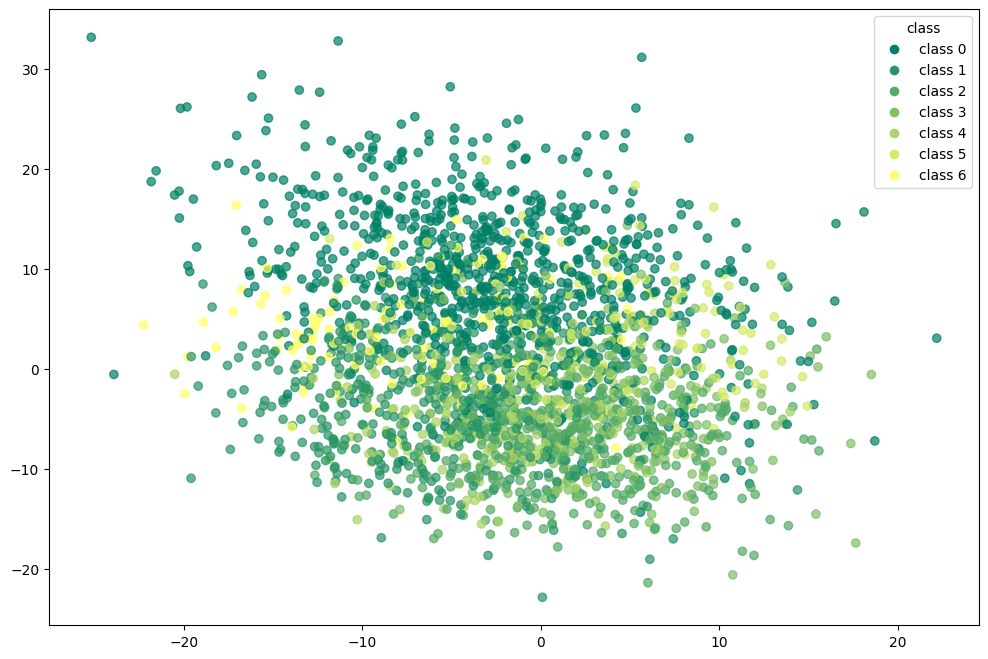

In [13708]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

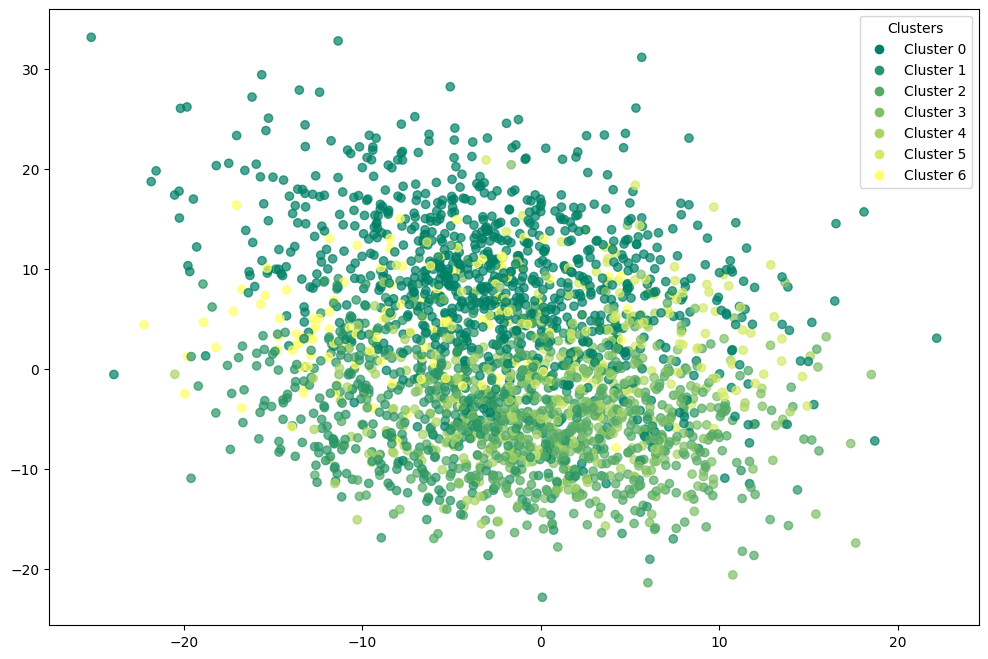

In [13709]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13710]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[879  14   0   3   1   2   1]
 [  2 441   2   2   3   0   0]
 [  0   1 449   0   0   0   0]
 [  0   2   0 222   1   0   0]
 [  0   8   0   1 216   0   0]
 [  1   4   2   0   0 116   2]
 [  0   0   0   0   0   0 125]]


In [13711]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       900
           1       0.94      0.98      0.96       450
           2       0.99      1.00      0.99       450
           3       0.97      0.99      0.98       225
           4       0.98      0.96      0.97       225
           5       0.98      0.93      0.95       125
           6       0.98      1.00      0.99       125

    accuracy                           0.98      2500
   macro avg       0.98      0.98      0.98      2500
weighted avg       0.98      0.98      0.98      2500



In [13712]:
adjusted_rand_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.9550720421342221

In [13713]:
normalized_mutual_info_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.9336406600920769

In [13714]:
silhouette_score(df_umap_gmm.drop(columns=['target','gmm_umap']).values,df_umap_gmm['gmm_umap'])

0.20758816291205823

## pam

In [13715]:
initial_medoids = np.random.choice(len(X_values),N_CLUSTER,replace=False)

In [13716]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [13717]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [13718]:
pam.process()

In [13719]:
clusters = pam.get_clusters()

In [13720]:
medoids = pam.get_medoids()

In [13721]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [13722]:
df_pam = corr_dataset.copy()

In [13723]:
df_pam['pam'] = labels

In [13724]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,pam
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,4.0
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,1.0
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,2.0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,2.0
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,3.0
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,4.0
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,3.0
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,5.0


In [13725]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.0312
accuracy after: 0.72


In [13726]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,pam
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,0
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


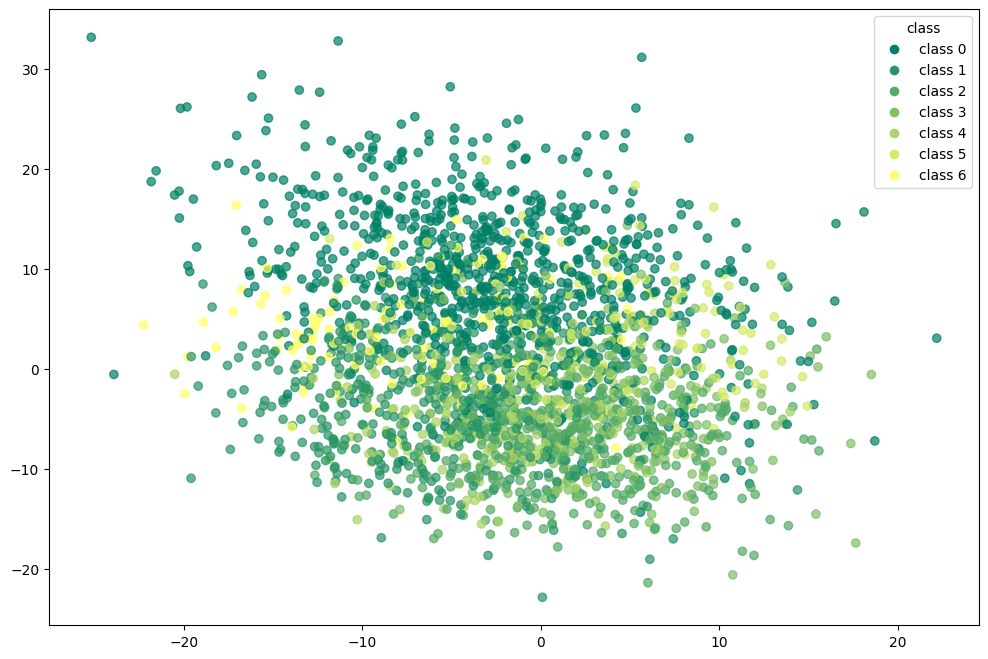

In [13727]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

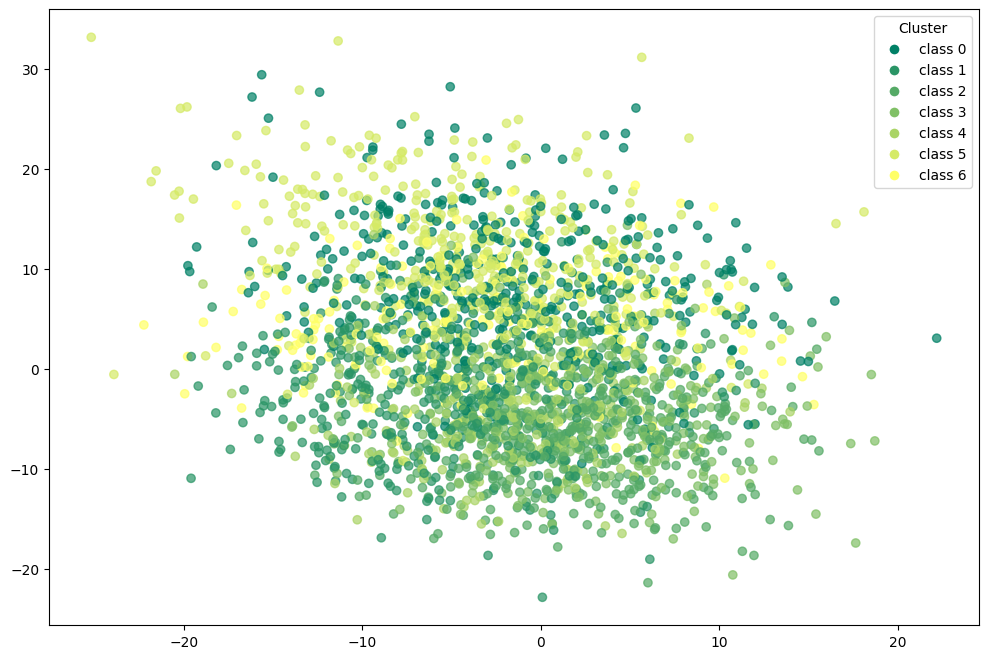

In [13728]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [13729]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[436  14   0  22   3 405  20]
 [  6 369   4  53  18   0   0]
 [  0   3 439   6   0   0   2]
 [  0   2   0 223   0   0   0]
 [  0   1   0  14 210   0   0]
 [  0  49   4   2   4   3  63]
 [  0   3   0   1   1   0 120]]


In [13730]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.99      0.48      0.65       900
           1       0.84      0.82      0.83       450
           2       0.98      0.98      0.98       450
           3       0.69      0.99      0.82       225
           4       0.89      0.93      0.91       225
           5       0.01      0.02      0.01       125
           6       0.59      0.96      0.73       125

    accuracy                           0.72      2500
   macro avg       0.71      0.74      0.70      2500
weighted avg       0.85      0.72      0.75      2500



In [13731]:
adjusted_rand_score(df_pam['target'],df_pam['pam'])

0.6293172583418101

In [13732]:
normalized_mutual_info_score(df_pam['target'],df_pam['pam'])

0.7308405556528941

In [13733]:
silhouette_score(df_pam.drop(columns=['target','pam']).values,df_pam['pam'])

0.15247113360821624

### pam with pca

In [13734]:
initial_medoids = np.random.choice(len(X_pca),N_CLUSTER,replace=False)

In [13735]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [13736]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [13737]:
pam_pca.process()

In [13738]:
clusters = pam_pca.get_clusters()

In [13739]:
medoids = pam_pca.get_medoids()

In [13740]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [13741]:
df_pam_pca = corr_dataset.copy()

In [13742]:
df_pam_pca['pam_pca'] = labels

In [13743]:
df_pam_pca

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,pam_pca
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,2.0
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3.0
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,1.0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,0.0
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,4.0
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,2.0
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,4.0
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,5.0


In [13744]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.3416
accuracy after: 0.7664


In [13745]:
df_pam_pca

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,pam_pca
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,5
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,0
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


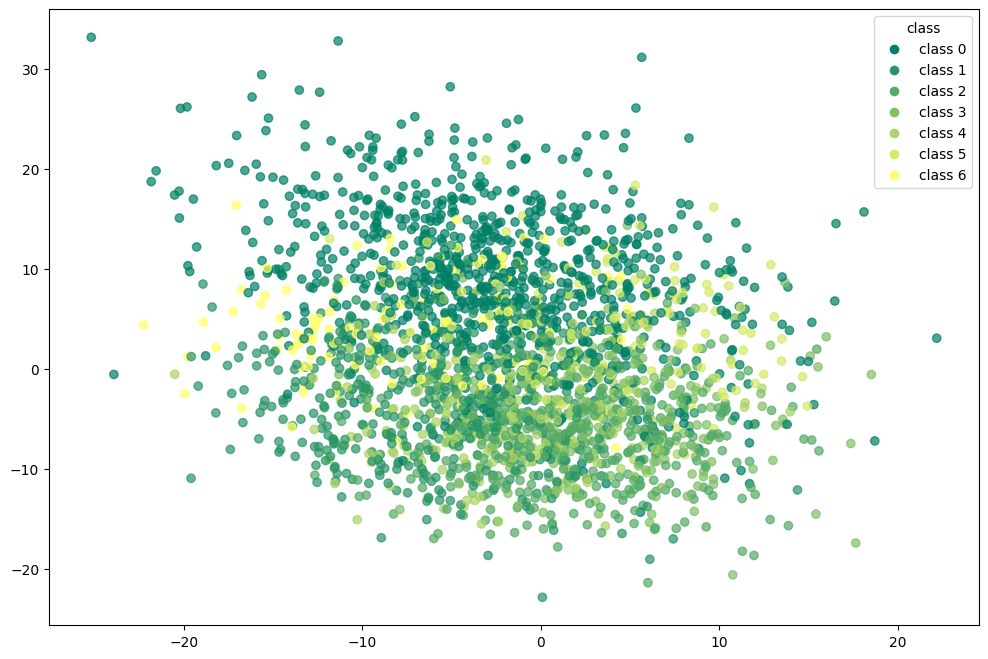

In [13746]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

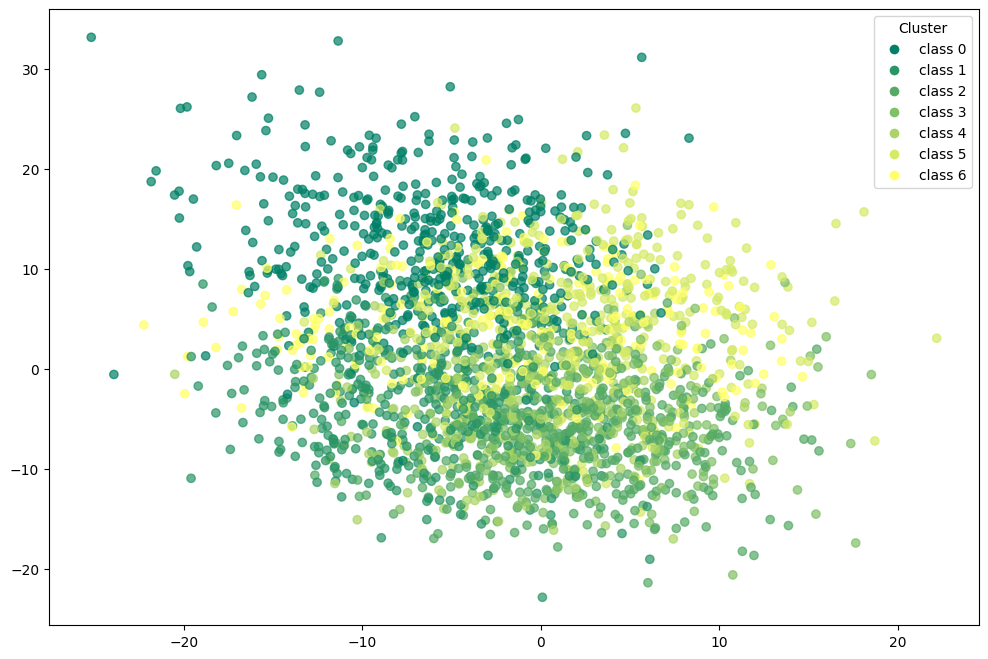

In [13747]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [13748]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[503   1   1   3   3 382   7]
 [  3 401   1  15  21   2   7]
 [  0   2 447   0   0   0   1]
 [  0   2   0 223   0   0   0]
 [  0   9   0   1 214   0   1]
 [  0   5   1   3   0   4 112]
 [  0   1   0   0   0   0 124]]


In [13749]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.99      0.56      0.72       900
           1       0.95      0.89      0.92       450
           2       0.99      0.99      0.99       450
           3       0.91      0.99      0.95       225
           4       0.90      0.95      0.92       225
           5       0.01      0.03      0.02       125
           6       0.49      0.99      0.66       125

    accuracy                           0.77      2500
   macro avg       0.75      0.77      0.74      2500
weighted avg       0.90      0.77      0.80      2500



In [13750]:
adjusted_rand_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.7116390495721158

In [13751]:
normalized_mutual_info_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.8148744217084999

In [13752]:
silhouette_score(df_pam_pca.drop(columns=['target','pam_pca']).values,df_pam_pca['pam_pca'])

0.1836421931212289

### pam with t-SNE

In [13753]:
initial_medoids = np.random.choice(len(X_tsne),N_CLUSTER,replace=False)

In [13754]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [13755]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [13756]:
pam_tsne.process()

In [13757]:
clusters = pam_tsne.get_clusters()

In [13758]:
medoids = pam_tsne.get_medoids()

In [13759]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [13760]:
df_pam_tsne = corr_dataset.copy()

In [13761]:
df_pam_tsne['pam_tsne'] = labels

In [13762]:
df_pam_tsne

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,pam_tsne
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,4.0
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,2.0
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,1.0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,5.0
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,6.0
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,4.0
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,6.0
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,3.0


In [13763]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.0084
accuracy after: 0.7504


In [13764]:
df_pam_tsne

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,pam_tsne
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,5
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,0
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


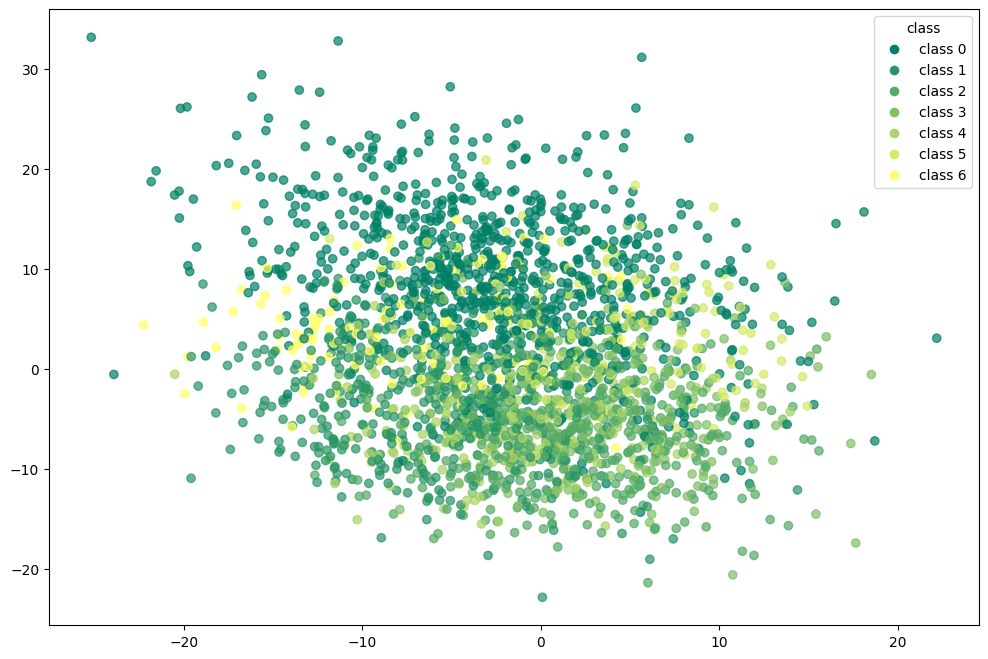

In [13765]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

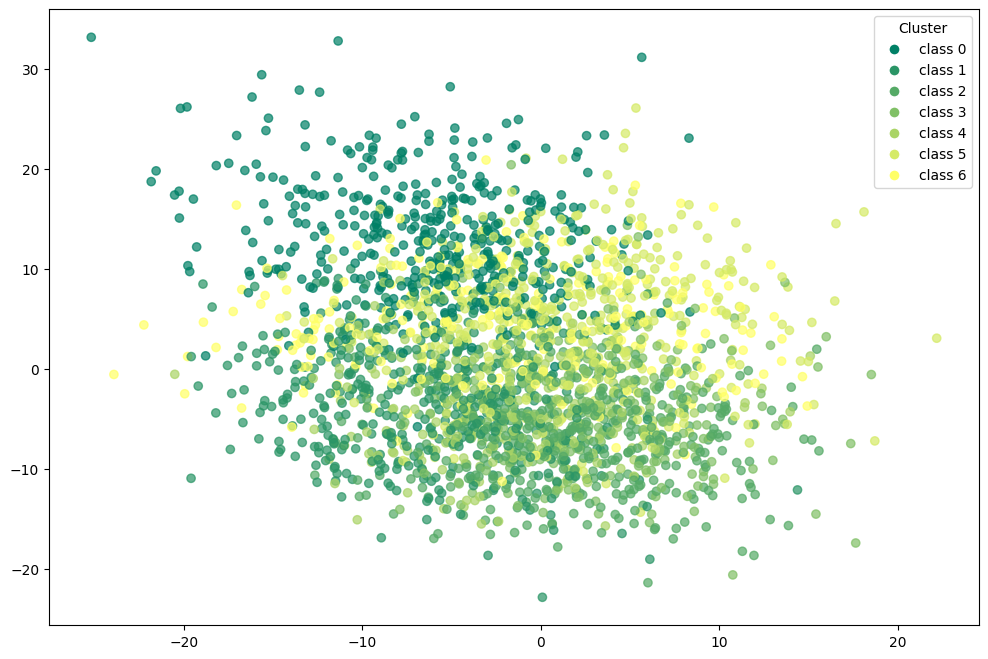

In [13766]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [13767]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[452  11   4   6   1 414  12]
 [  0 406  10  10  16   4   4]
 [  0   1 448   0   0   0   1]
 [  0   0   0 223   2   0   0]
 [  0   3   0   1 221   0   0]
 [  0   3   1   0   1   1 119]
 [  0   0   0   0   0   0 125]]


In [13768]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.50      0.67       900
           1       0.96      0.90      0.93       450
           2       0.97      1.00      0.98       450
           3       0.93      0.99      0.96       225
           4       0.92      0.98      0.95       225
           5       0.00      0.01      0.00       125
           6       0.48      1.00      0.65       125

    accuracy                           0.75      2500
   macro avg       0.75      0.77      0.73      2500
weighted avg       0.90      0.75      0.79      2500



In [13769]:
adjusted_rand_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.7011870710424623

In [13770]:
normalized_mutual_info_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.8141192293140571

In [13771]:
silhouette_score(df_pam_tsne.drop(columns=['target','pam_tsne']).values,df_pam_tsne['pam_tsne'])

0.18130648895681875

### pam with umap

In [13772]:
initial_medoids = np.random.choice(len(X_umap),N_CLUSTER,replace=False)

In [13773]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [13774]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [13775]:
pam_umap.process()

In [13776]:
clusters = pam_umap.get_clusters()

In [13777]:
medoids = pam_umap.get_medoids()

In [13778]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [13779]:
df_pam_umap = corr_dataset.copy()

In [13780]:
df_pam_umap['pam_umap'] = labels

In [13781]:
df_pam_umap

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,pam_umap
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,2.0
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,1.0
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,5.0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,3.0
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,0.0
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,2.0
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,0.0
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,6.0


In [13782]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.0016
accuracy after: 0.7736


In [13783]:
df_pam_umap

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,pam_umap
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,5
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


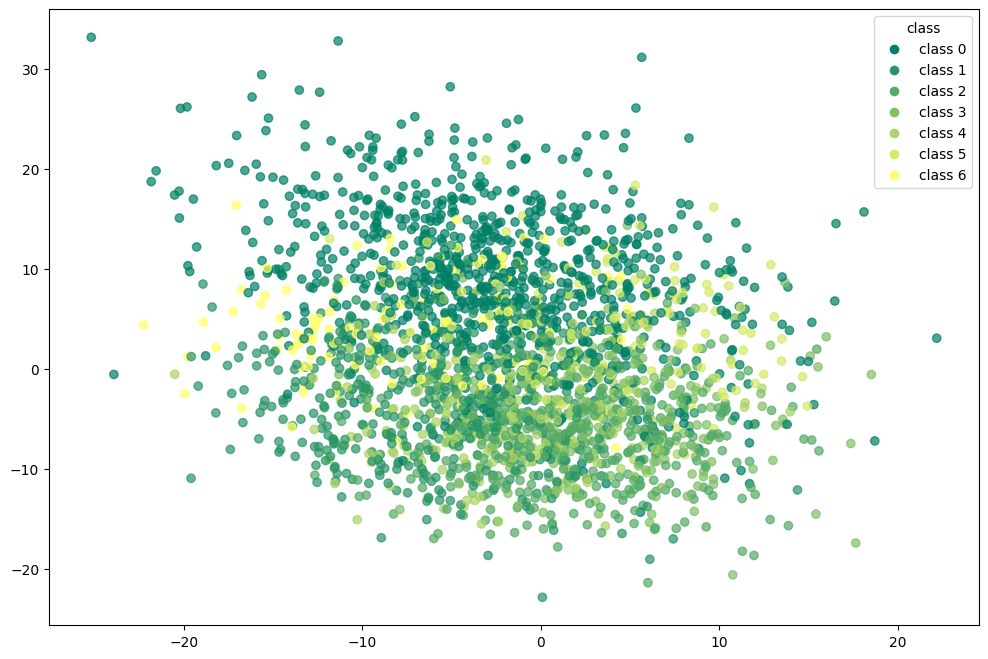

In [13784]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

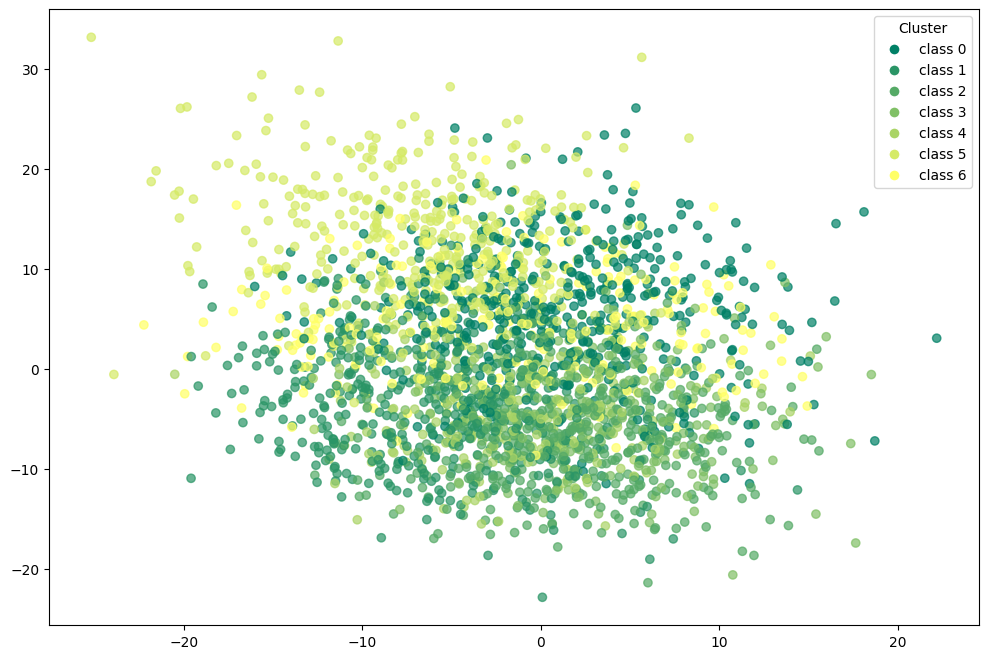

In [13785]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [13786]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[478  14   0   3   1 401   3]
 [  1 440   2   2   4   1   0]
 [  0   1 449   0   0   0   0]
 [  0   1   0 222   2   0   0]
 [  0   4   0   1 220   0   0]
 [  1   4   2   0   0   0 118]
 [  0   0   0   0   0   0 125]]


In [13787]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      0.53      0.69       900
           1       0.95      0.98      0.96       450
           2       0.99      1.00      0.99       450
           3       0.97      0.99      0.98       225
           4       0.97      0.98      0.97       225
           5       0.00      0.00      0.00       125
           6       0.51      1.00      0.67       125

    accuracy                           0.77      2500
   macro avg       0.77      0.78      0.75      2500
weighted avg       0.91      0.77      0.81      2500



In [13788]:
adjusted_rand_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.7367770359224605

In [13789]:
normalized_mutual_info_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.8562010069966611

In [13790]:
silhouette_score(df_pam_umap.drop(columns=['target','pam_umap']).values,df_pam_umap['pam_umap'])

0.1884767666076322

## spectral clustering

In [13791]:
spectral_clustering = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [13792]:
spectral_clustering.fit(X_values)

,n_clusters,7
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [13793]:
df_spectral = corr_dataset.copy()

In [13794]:
df_spectral['spectral_clustering'] = spectral_clustering.labels_

In [13795]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,spectral_clustering
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,0
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,1
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,1
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,0
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


In [13796]:
y_true = df_spectral['target'].values  
y_spectral = df_spectral['spectral_clustering'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_spectral['spectral_clustering'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_spectral['spectral_clustering'] == y_true))

accuracy before: 0.4528
accuracy after: 0.9796


In [13797]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,spectral_clustering
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,0
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


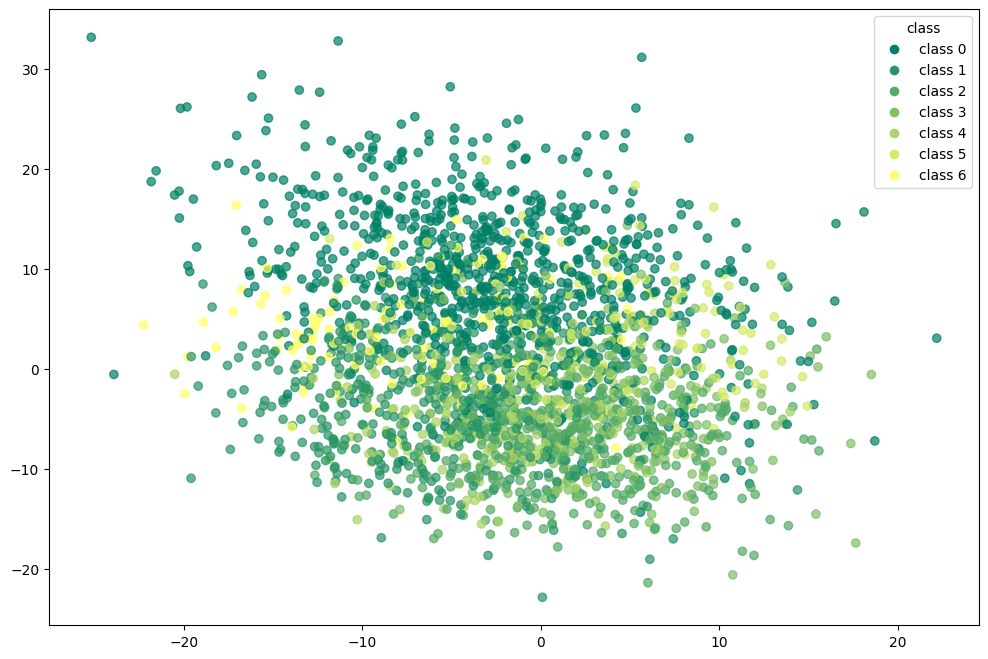

In [13798]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0],df_spectral.iloc[:, 1], 
                      c=df_spectral['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_spectral['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

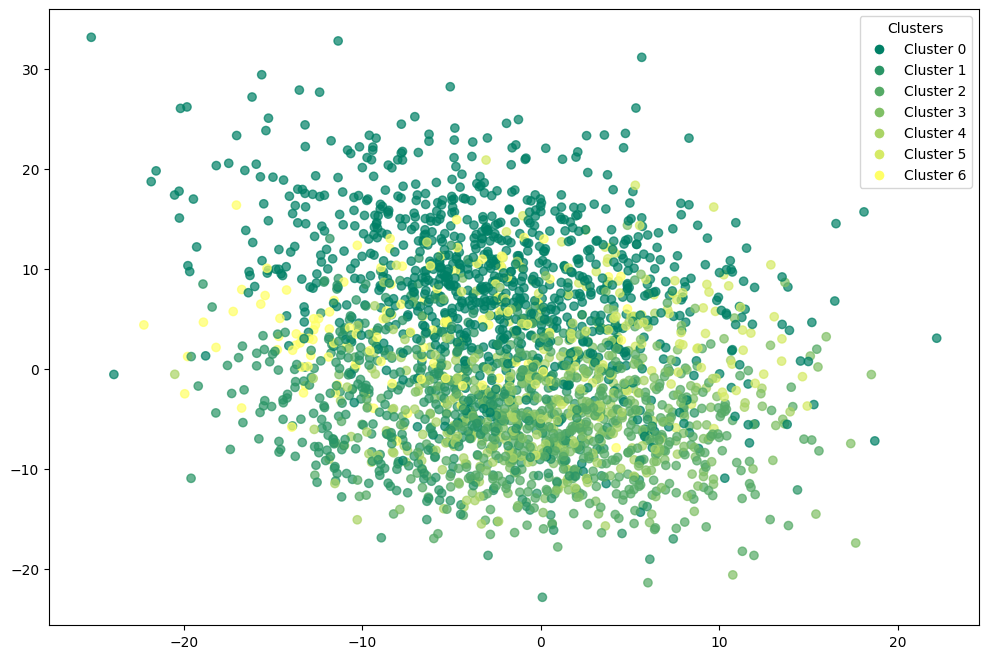

In [13799]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0], df_spectral.iloc[:, 1], 
                      c=df_spectral['spectral_clustering'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_spectral['spectral_clustering'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13800]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[886   7   2   3   0   2   0]
 [  2 440   3   2   3   0   0]
 [  0   1 449   0   0   0   0]
 [  0   1   0 224   0   0   0]
 [  0   9   0   1 215   0   0]
 [  3   8   3   0   0 110   1]
 [  0   0   0   0   0   0 125]]


In [13801]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99       900
           1       0.94      0.98      0.96       450
           2       0.98      1.00      0.99       450
           3       0.97      1.00      0.98       225
           4       0.99      0.96      0.97       225
           5       0.98      0.88      0.93       125
           6       0.99      1.00      1.00       125

    accuracy                           0.98      2500
   macro avg       0.98      0.97      0.97      2500
weighted avg       0.98      0.98      0.98      2500



In [13802]:
adjusted_rand_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.9587673831227513

In [13803]:
normalized_mutual_info_score(df_spectral['target'],df_spectral['spectral_clustering'])

0.9352182043846852

In [13804]:
silhouette_score(df_spectral.drop(columns=['target','spectral_clustering']).values,df_spectral['spectral_clustering'])

0.20803685626242663

### spectral clustering with pca

In [13805]:
spectral_pca = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [13806]:
spectral_pca.fit(X_pca)

,n_clusters,7
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [13807]:
df_pca_spectral = corr_dataset.copy()

In [13808]:
df_pca_spectral["spectral_pca"] = spectral_pca.labels_

In [13809]:
df_pca_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,spectral_pca
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,2
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,6
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,4
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,1
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,2
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,1
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,5


In [13810]:
y_true = df_pca_spectral['target'].values  
y_spectral_pca = df_pca_spectral['spectral_pca'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_pca)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_spectral['spectral_pca'] = np.array([mapping[label] for label in y_spectral_pca])

print("accuracy before:", np.mean(y_spectral_pca == y_true))
print("accuracy after:", np.mean(df_pca_spectral['spectral_pca'] == y_true))

accuracy before: 0.202
accuracy after: 0.77


In [13811]:
df_pca_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,spectral_pca
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,5
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


In [13812]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[500   7   1   1   3 383   5]
 [  1 423   3   8   9   1   5]
 [  0   2 447   0   0   0   1]
 [  0   7   0 218   0   0   0]
 [  0  10   0   1 214   0   0]
 [  5   5   3   0   0   1 111]
 [  1   2   0   0   0   0 122]]


In [13813]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       0.99      0.56      0.71       900
           1       0.93      0.94      0.93       450
           2       0.98      0.99      0.99       450
           3       0.96      0.97      0.96       225
           4       0.95      0.95      0.95       225
           5       0.00      0.01      0.00       125
           6       0.50      0.98      0.66       125

    accuracy                           0.77      2500
   macro avg       0.76      0.77      0.74      2500
weighted avg       0.90      0.77      0.81      2500



In [13814]:
adjusted_rand_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.7180095886255504

In [13815]:
normalized_mutual_info_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

0.8205495490141357

In [13816]:
silhouette_score(df_pca_spectral.drop(columns=['target','spectral_pca']).values,df_pca_spectral['spectral_pca'])

0.18572994502908888

### spectral clustering with t-SNE

In [13817]:
spectral_tsne = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [13818]:
spectral_tsne.fit(X_tsne)

,n_clusters,7
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [13819]:
df_tsne_spectral = corr_dataset.copy()

In [13820]:
df_tsne_spectral['spectral_tsne'] = spectral_tsne.labels_

In [13821]:
df_tsne_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,spectral_tsne
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,0
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,2
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,1
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,1
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,3
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,0
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,3
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


In [13822]:
y_true = df_tsne_spectral['target'].values  
y_spectral_tsne = df_tsne_spectral['spectral_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_tsne)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_spectral['spectral_tsne'] = np.array([mapping[label] for label in y_spectral_tsne])

print("accuracy before:", np.mean(y_spectral_tsne == y_true))
print("accuracy after:", np.mean(df_tsne_spectral['spectral_tsne'] == y_true))

accuracy before: 0.0912
accuracy after: 0.9736


In [13823]:
df_tsne_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,spectral_tsne
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,3
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,0
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


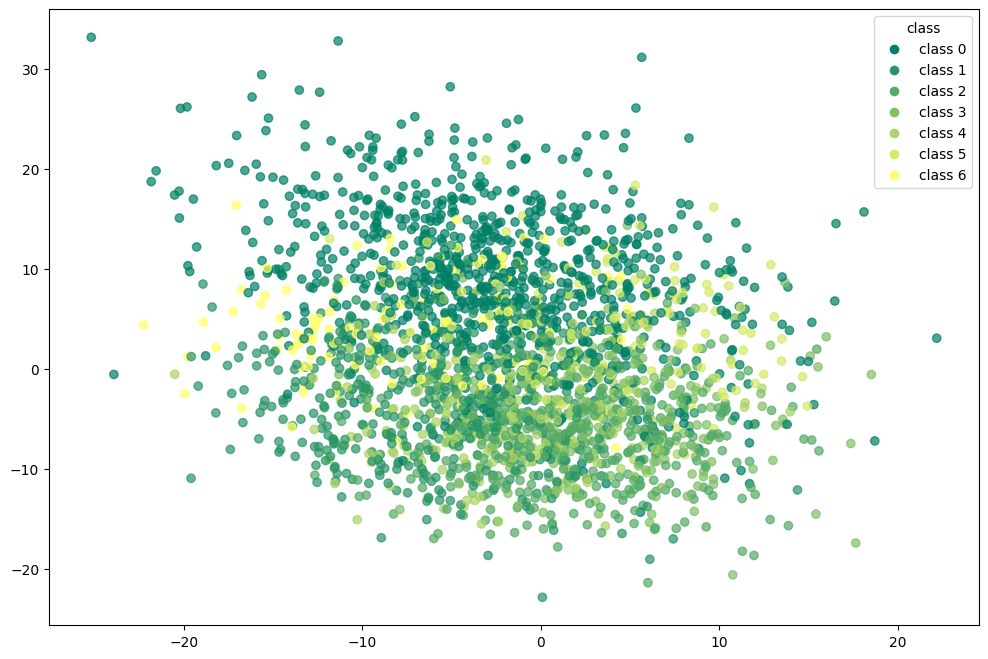

In [13824]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

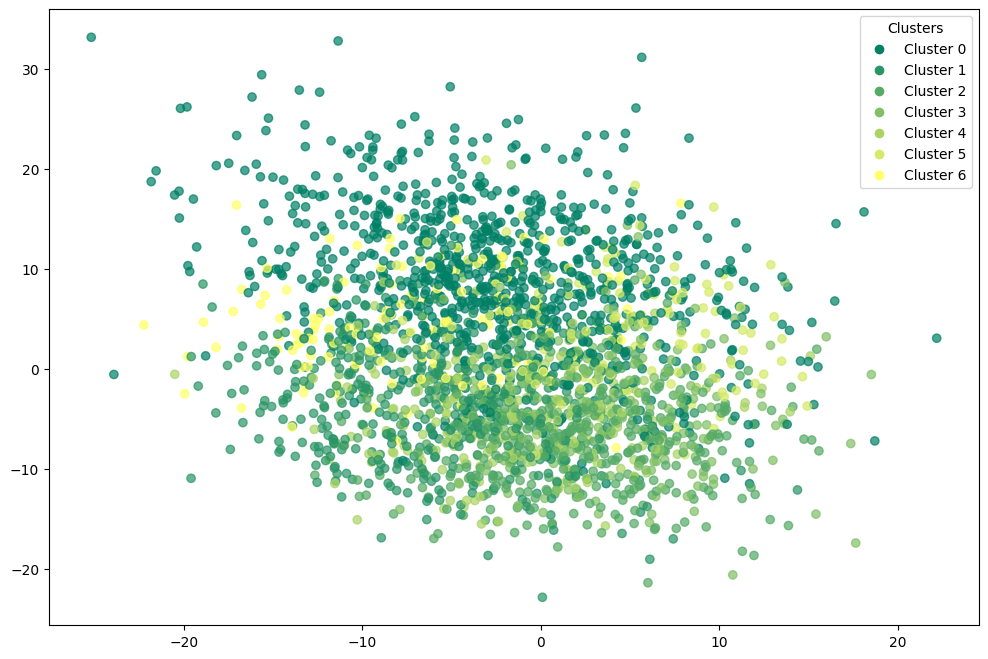

In [13825]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['spectral_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_spectral['spectral_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13826]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[880  10   0   4   1   3   2]
 [  2 431   4   6   3   3   1]
 [  0   1 448   0   0   1   0]
 [  1   2   0 221   1   0   0]
 [  0  11   0   1 213   0   0]
 [  1   4   1   0   0 116   3]
 [  0   0   0   0   0   0 125]]


In [13827]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       900
           1       0.94      0.96      0.95       450
           2       0.99      1.00      0.99       450
           3       0.95      0.98      0.97       225
           4       0.98      0.95      0.96       225
           5       0.94      0.93      0.94       125
           6       0.95      1.00      0.98       125

    accuracy                           0.97      2500
   macro avg       0.96      0.97      0.97      2500
weighted avg       0.97      0.97      0.97      2500



In [13828]:
adjusted_rand_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.9479185027542447

In [13829]:
normalized_mutual_info_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.9169910815549375

In [13830]:
silhouette_score(df_tsne_spectral.drop(columns=['target','spectral_tsne']).values,df_tsne_spectral['spectral_tsne'])

0.2059388852651723

### spectral clustering with umap

In [13831]:
spectral_umap = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors')

In [13832]:
spectral_umap.fit(X_umap)

,n_clusters,7
,eigen_solver,None
,n_components,None
,random_state,None
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [13833]:
df_umap_spectral = corr_dataset.copy()

In [13834]:
df_umap_spectral['spectral_umap'] = spectral_umap.labels_

In [13835]:
df_umap_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,spectral_umap
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,4
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,0
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,0
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,3
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,4
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,3
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,1


In [13836]:
y_true = df_umap_spectral['target'].values  
y_spectral = df_umap_spectral['spectral_umap'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_spectral['spectral_umap'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_umap_spectral['spectral_umap'] == y_true))

accuracy before: 0.2704
accuracy after: 0.71


In [13837]:
df_umap_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,target,spectral_umap
0,-1.421458,-4.301084,8.195172,-11.002340,7.719081,4.208511,-16.696872,-4.792182,1.041838,-0.405226,10.139129,1.261415,7.366723,10.458211,-14.296155,1,1
1,-1.457885,-8.917127,-0.213915,11.132235,-7.519638,15.488125,-1.732140,5.252501,2.759593,6.316403,5.266126,-16.581585,-10.470697,-4.828012,3.197136,3,0
2,-4.129217,2.783894,4.542658,-2.488555,-4.184534,-13.272958,-5.116781,6.756740,6.897890,7.159969,-22.086043,16.016897,-4.112616,-10.424852,2.169319,0,0
3,-11.022418,11.790091,10.073995,8.573166,-6.035348,-8.339651,-10.087786,6.783910,3.955673,12.124334,-17.811326,8.057057,17.495198,-7.049147,-8.211992,0,0
4,-3.919532,-6.372075,-7.982581,0.222543,-4.964094,6.774374,9.061517,10.428584,10.142705,9.036180,9.939945,-13.536582,-13.486062,-0.414503,4.780214,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,5.413684,-7.909613,-8.344419,11.660695,3.169604,6.947085,-9.920853,-19.055103,8.033009,-13.144030,-16.739223,-8.605490,-11.089933,6.351144,-10.707694,2,2
2496,-6.265892,-2.945550,3.557117,-0.617342,3.976705,-5.104262,-13.624097,0.387115,-9.549330,-0.363090,-3.658956,-1.046845,7.279929,2.099729,-10.775942,1,1
2497,8.926991,-8.294203,-11.974829,13.323592,12.800254,7.853727,-4.164834,-2.551893,3.433766,-2.693988,-6.255693,2.977744,-7.710979,13.893155,-4.153462,2,2
2498,-5.864310,-5.300282,3.956347,-4.892657,-5.826689,2.731719,-7.875715,6.424460,-8.964393,10.272336,5.864015,-3.952743,-3.695474,12.027223,2.221086,4,4


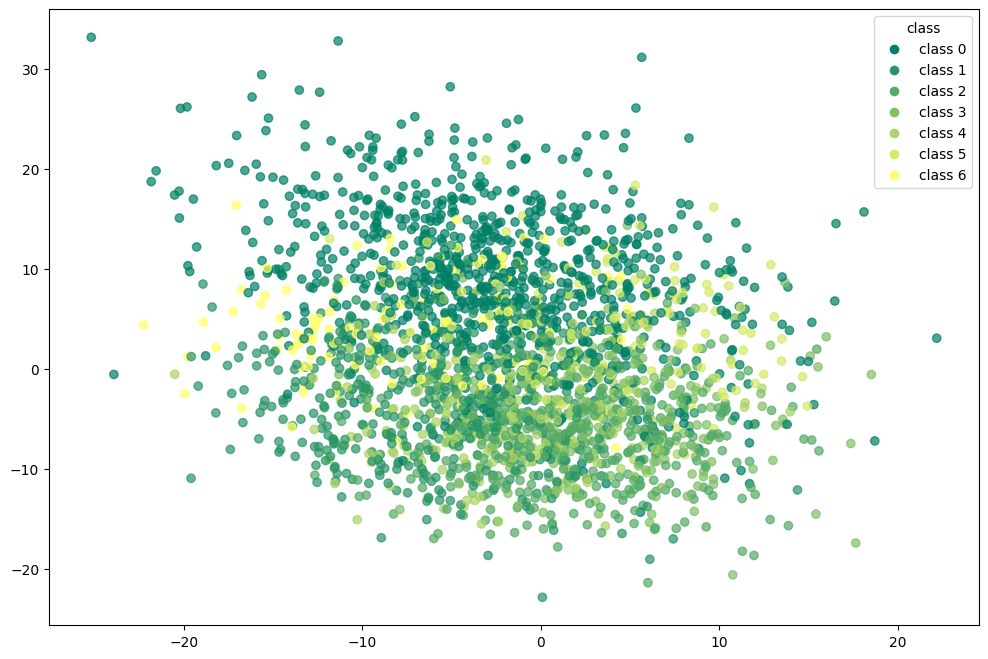

In [13838]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',    
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

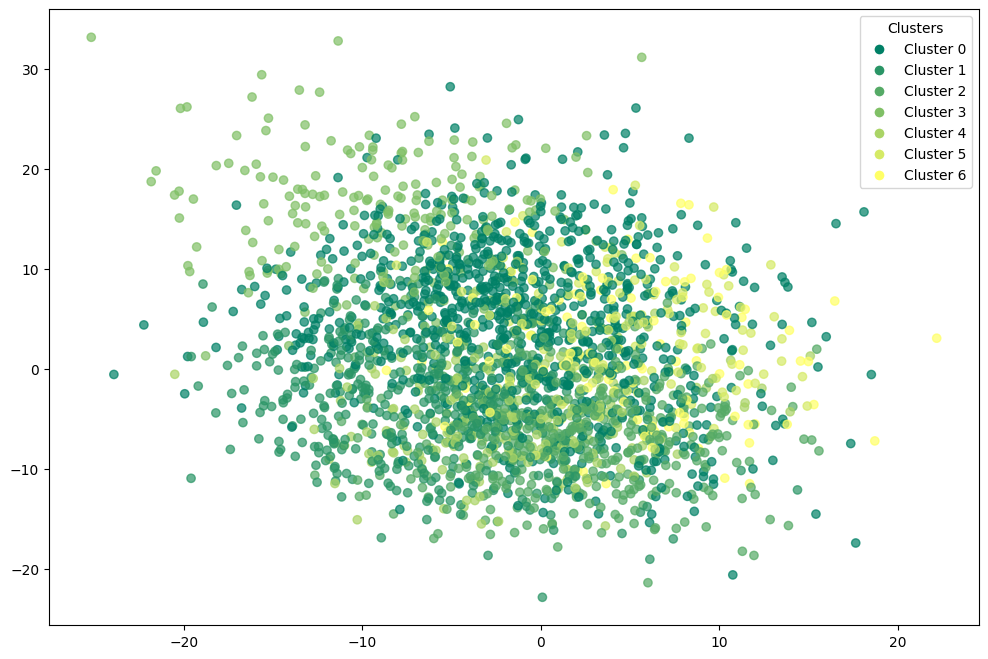

In [13839]:
plt.figure(figsize=(12,8)) 
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['spectral_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_spectral['spectral_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [13840]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[551  14   0 220   1   2 112]
 [  3 440   2   1   4   0   0]
 [  0   1 449   0   0   0   0]
 [222   2   0   0   1   0   0]
 [  1   5   0   0 219   0   0]
 [  3   4   2   0   0 116   0]
 [125   0   0   0   0   0   0]]


In [13841]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])) 

              precision    recall  f1-score   support

           0       0.61      0.61      0.61       900
           1       0.94      0.98      0.96       450
           2       0.99      1.00      0.99       450
           3       0.00      0.00      0.00       225
           4       0.97      0.97      0.97       225
           5       0.98      0.93      0.95       125
           6       0.00      0.00      0.00       125

    accuracy                           0.71      2500
   macro avg       0.64      0.64      0.64      2500
weighted avg       0.70      0.71      0.71      2500



In [13842]:
adjusted_rand_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.5560692205077991

In [13843]:
normalized_mutual_info_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.7509788181481668

In [13844]:
silhouette_score(df_umap_spectral.drop(columns=['target','spectral_umap']).values,df_umap_spectral['spectral_umap'])

0.12366733191816297

# accuracy and confusion matrix 

## k-means

In [13845]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.99      0.51      0.67       900
           1       0.97      0.96      0.97       450
           2       0.99      0.99      0.99       450
           3       0.97      1.00      0.99       225
           4       0.97      0.98      0.97       225
           5       0.00      0.00      0.00       125
           6       0.48      1.00      0.64       125

    accuracy                           0.76      2500
   macro avg       0.77      0.78      0.75      2500
weighted avg       0.91      0.76      0.80      2500



In [13846]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[457   6   3   3   2 419  10]
 [  1 432   1   2   6   1   7]
 [  0   1 447   0   0   0   2]
 [  0   0   0 225   0   0   0]
 [  0   3   0   1 221   0   0]
 [  2   3   1   0   0   0 119]
 [  0   0   0   0   0   0 125]]


## k-menas + pca

In [13847]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.99      0.49      0.66       900
           1       0.96      0.86      0.91       450
           2       0.98      0.99      0.99       450
           3       0.91      0.99      0.95       225
           4       0.85      0.97      0.91       225
           5       0.00      0.00      0.00       125
           6       0.48      0.98      0.65       125

    accuracy                           0.74      2500
   macro avg       0.74      0.76      0.72      2500
weighted avg       0.89      0.74      0.78      2500



In [13848]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[445   3   2   3   5 434   8]
 [  0 388   5  17  32   1   7]
 [  0   1 447   0   0   0   2]
 [  0   2   0 223   0   0   0]
 [  0   6   0   1 218   0   0]
 [  3   3   2   2   1   0 114]
 [  1   1   0   0   0   0 123]]


## k-means + t-SNE

In [13849]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.49      0.66       900
           1       0.95      0.92      0.94       450
           2       0.98      0.99      0.99       450
           3       0.91      0.99      0.95       225
           4       0.94      0.98      0.96       225
           5       0.00      0.01      0.00       125
           6       0.47      1.00      0.64       125

    accuracy                           0.75      2500
   macro avg       0.75      0.77      0.73      2500
weighted avg       0.90      0.75      0.79      2500



In [13850]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[442  11   2   9   1 422  13]
 [  0 414   6  12  11   3   4]
 [  0   1 446   0   0   0   3]
 [  0   0   0 223   2   0   0]
 [  0   4   0   1 220   0   0]
 [  0   4   0   0   0   1 120]
 [  0   0   0   0   0   0 125]]


## k-means + UMAP

In [13851]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       900
           1       0.95      0.98      0.96       450
           2       0.99      1.00      0.99       450
           3       0.97      0.99      0.98       225
           4       0.97      0.98      0.97       225
           5       0.98      0.93      0.95       125
           6       0.98      1.00      0.99       125

    accuracy                           0.98      2500
   macro avg       0.98      0.98      0.98      2500
weighted avg       0.98      0.98      0.98      2500



In [13852]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[879  14   0   3   1   2   1]
 [  2 440   2   2   4   0   0]
 [  0   1 449   0   0   0   0]
 [  0   1   0 222   2   0   0]
 [  0   4   0   1 220   0   0]
 [  1   4   2   0   0 116   2]
 [  0   0   0   0   0   0 125]]


## Birch

In [13853]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       0.98      0.73      0.84       900
           1       0.92      0.92      0.92       450
           2       0.99      0.98      0.99       450
           3       0.97      0.96      0.97       225
           4       0.92      0.96      0.94       225
           5       0.00      0.00      0.00       125
           6       0.48      0.98      0.65       125

    accuracy                           0.83      2500
   macro avg       0.75      0.79      0.76      2500
weighted avg       0.89      0.83      0.85      2500



In [13854]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[657  16   0   4   0 218   5]
 [  6 416   3   2  18   1   4]
 [  0   3 442   0   0   0   5]
 [  0   5   0 217   2   0   1]
 [  0   7   0   1 217   0   0]
 [  3   3   2   0   0   0 117]
 [  2   0   0   0   0   0 123]]


## Birch + pca

In [13855]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       0.99      0.45      0.62       900
           1       0.04      0.04      0.04       450
           2       0.40      0.99      0.57       450
           3       0.94      0.96      0.95       225
           4       0.00      0.00      0.00       225
           5       0.00      0.00      0.00       125
           6       0.49      0.98      0.65       125

    accuracy                           0.48      2500
   macro avg       0.41      0.49      0.40      2500
weighted avg       0.54      0.48      0.45      2500



In [13856]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[407 408   9   2  57  11   6]
 [  1  16 410  10   0   0  13]
 [  0   1 447   0   0   1   1]
 [  0   0   8 215   0   2   0]
 [  1   0 223   1   0   0   0]
 [  3   0  13   0   0   0 109]
 [  0   0   3   0   0   0 122]]


## Birch + t-SNE

In [13857]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       0.99      0.59      0.74       900
           1       0.94      0.92      0.93       450
           2       0.98      1.00      0.99       450
           3       0.95      0.98      0.97       225
           4       0.92      0.96      0.94       225
           5       0.00      0.00      0.00       125
           6       0.50      1.00      0.67       125

    accuracy                           0.78      2500
   macro avg       0.75      0.78      0.75      2500
weighted avg       0.90      0.78      0.82      2500



In [13858]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

[[535  12   0   4   1 343   5]
 [  5 415   4   7  15   0   4]
 [  0   1 449   0   0   0   0]
 [  1   1   0 221   2   0   0]
 [  0   7   0   1 217   0   0]
 [  1   4   4   0   0   0 116]
 [  0   0   0   0   0   0 125]]


## Birch + UMAP

In [13859]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       900
           1       0.64      0.99      0.78       450
           2       0.99      1.00      0.99       450
           3       0.97      0.99      0.98       225
           4       0.00      0.00      0.00       225
           5       0.98      0.93      0.95       125
           6       0.98      1.00      0.99       125

    accuracy                           0.89      2500
   macro avg       0.79      0.84      0.81      2500
weighted avg       0.84      0.89      0.86      2500



In [13860]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

[[879  15   0   3   0   2   1]
 [  2 444   2   2   0   0   0]
 [  0   1 449   0   0   0   0]
 [  0   3   0 222   0   0   0]
 [  0 224   0   1   0   0   0]
 [  1   4   2   0   0 116   2]
 [  0   0   0   0   0   0 125]]


## GMM

In [13861]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      0.92      0.96       900
           1       0.97      0.75      0.85       450
           2       1.00      1.00      1.00       450
           3       0.97      1.00      0.98       225
           4       0.57      0.64      0.60       225
           5       0.64      0.95      0.77       125
           6       0.60      0.99      0.74       125

    accuracy                           0.89      2500
   macro avg       0.82      0.89      0.84      2500
weighted avg       0.91      0.89      0.89      2500



In [13862]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[826   4   0   3   1  66   0]
 [  3 338   0   2 105   1   1]
 [  0   0 449   0   1   0   0]
 [  0   0   0 224   1   0   0]
 [  0   0   0   1 143   0  81]
 [  0   4   0   0   0 119   2]
 [  0   1   0   0   0   0 124]]


## GMM + pca

In [13863]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.99      0.66      0.79       900
           1       0.97      0.84      0.90       450
           2       0.99      0.84      0.91       450
           3       0.44      1.00      0.61       225
           4       0.00      0.00      0.00       225
           5       0.01      0.02      0.01       125
           6       0.50      0.98      0.67       125

    accuracy                           0.68      2500
   macro avg       0.56      0.62      0.56      2500
weighted avg       0.77      0.68      0.70      2500



In [13864]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[597   3   0   5   1 290   4]
 [  2 379   1  61   4   0   3]
 [  0   1 377   0  70   0   2]
 [  0   0   0 225   0   0   0]
 [  0   5   0 220   0   0   0]
 [  3   2   1   4   0   3 112]
 [  1   1   0   0   0   0 123]]


## GMM + t-SNE

In [13865]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.98      0.50      0.66       900
           1       0.93      0.96      0.95       450
           2       0.99      1.00      0.99       450
           3       0.97      0.98      0.97       225
           4       0.98      0.95      0.96       225
           5       0.00      0.00      0.00       125
           6       0.50      1.00      0.66       125

    accuracy                           0.76      2500
   macro avg       0.76      0.77      0.74      2500
weighted avg       0.90      0.76      0.80      2500



In [13866]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[451  13   0   3   1 428   4]
 [  6 431   4   4   2   0   3]
 [  0   1 448   0   0   0   1]
 [  1   2   0 221   1   0   0]
 [  0  11   0   1 213   0   0]
 [  1   4   2   0   0   0 118]
 [  0   0   0   0   0   0 125]]


## GMM + UMAP

In [13867]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       900
           1       0.94      0.98      0.96       450
           2       0.99      1.00      0.99       450
           3       0.97      0.99      0.98       225
           4       0.98      0.96      0.97       225
           5       0.98      0.93      0.95       125
           6       0.98      1.00      0.99       125

    accuracy                           0.98      2500
   macro avg       0.98      0.98      0.98      2500
weighted avg       0.98      0.98      0.98      2500



In [13868]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[879  14   0   3   1   2   1]
 [  2 441   2   2   3   0   0]
 [  0   1 449   0   0   0   0]
 [  0   2   0 222   1   0   0]
 [  0   8   0   1 216   0   0]
 [  1   4   2   0   0 116   2]
 [  0   0   0   0   0   0 125]]


## PAM

In [13869]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[436  14   0  22   3 405  20]
 [  6 369   4  53  18   0   0]
 [  0   3 439   6   0   0   2]
 [  0   2   0 223   0   0   0]
 [  0   1   0  14 210   0   0]
 [  0  49   4   2   4   3  63]
 [  0   3   0   1   1   0 120]]


In [13870]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.99      0.48      0.65       900
           1       0.84      0.82      0.83       450
           2       0.98      0.98      0.98       450
           3       0.69      0.99      0.82       225
           4       0.89      0.93      0.91       225
           5       0.01      0.02      0.01       125
           6       0.59      0.96      0.73       125

    accuracy                           0.72      2500
   macro avg       0.71      0.74      0.70      2500
weighted avg       0.85      0.72      0.75      2500



## PAM + pca

In [13871]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[503   1   1   3   3 382   7]
 [  3 401   1  15  21   2   7]
 [  0   2 447   0   0   0   1]
 [  0   2   0 223   0   0   0]
 [  0   9   0   1 214   0   1]
 [  0   5   1   3   0   4 112]
 [  0   1   0   0   0   0 124]]


In [13872]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.99      0.56      0.72       900
           1       0.95      0.89      0.92       450
           2       0.99      0.99      0.99       450
           3       0.91      0.99      0.95       225
           4       0.90      0.95      0.92       225
           5       0.01      0.03      0.02       125
           6       0.49      0.99      0.66       125

    accuracy                           0.77      2500
   macro avg       0.75      0.77      0.74      2500
weighted avg       0.90      0.77      0.80      2500



## PAM + t-SNE

In [13873]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[452  11   4   6   1 414  12]
 [  0 406  10  10  16   4   4]
 [  0   1 448   0   0   0   1]
 [  0   0   0 223   2   0   0]
 [  0   3   0   1 221   0   0]
 [  0   3   1   0   1   1 119]
 [  0   0   0   0   0   0 125]]


In [13874]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.50      0.67       900
           1       0.96      0.90      0.93       450
           2       0.97      1.00      0.98       450
           3       0.93      0.99      0.96       225
           4       0.92      0.98      0.95       225
           5       0.00      0.01      0.00       125
           6       0.48      1.00      0.65       125

    accuracy                           0.75      2500
   macro avg       0.75      0.77      0.73      2500
weighted avg       0.90      0.75      0.79      2500



## PAM + umap

In [13875]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[478  14   0   3   1 401   3]
 [  1 440   2   2   4   1   0]
 [  0   1 449   0   0   0   0]
 [  0   1   0 222   2   0   0]
 [  0   4   0   1 220   0   0]
 [  1   4   2   0   0   0 118]
 [  0   0   0   0   0   0 125]]


In [13876]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      0.53      0.69       900
           1       0.95      0.98      0.96       450
           2       0.99      1.00      0.99       450
           3       0.97      0.99      0.98       225
           4       0.97      0.98      0.97       225
           5       0.00      0.00      0.00       125
           6       0.51      1.00      0.67       125

    accuracy                           0.77      2500
   macro avg       0.77      0.78      0.75      2500
weighted avg       0.91      0.77      0.81      2500



## spectral clustering

In [13877]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[886   7   2   3   0   2   0]
 [  2 440   3   2   3   0   0]
 [  0   1 449   0   0   0   0]
 [  0   1   0 224   0   0   0]
 [  0   9   0   1 215   0   0]
 [  3   8   3   0   0 110   1]
 [  0   0   0   0   0   0 125]]


In [13878]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99       900
           1       0.94      0.98      0.96       450
           2       0.98      1.00      0.99       450
           3       0.97      1.00      0.98       225
           4       0.99      0.96      0.97       225
           5       0.98      0.88      0.93       125
           6       0.99      1.00      1.00       125

    accuracy                           0.98      2500
   macro avg       0.98      0.97      0.97      2500
weighted avg       0.98      0.98      0.98      2500



## spectral clustering + pca

In [13879]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[500   7   1   1   3 383   5]
 [  1 423   3   8   9   1   5]
 [  0   2 447   0   0   0   1]
 [  0   7   0 218   0   0   0]
 [  0  10   0   1 214   0   0]
 [  5   5   3   0   0   1 111]
 [  1   2   0   0   0   0 122]]


In [13880]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       0.99      0.56      0.71       900
           1       0.93      0.94      0.93       450
           2       0.98      0.99      0.99       450
           3       0.96      0.97      0.96       225
           4       0.95      0.95      0.95       225
           5       0.00      0.01      0.00       125
           6       0.50      0.98      0.66       125

    accuracy                           0.77      2500
   macro avg       0.76      0.77      0.74      2500
weighted avg       0.90      0.77      0.81      2500



## spectral clustering + t-SNE

In [13881]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[880  10   0   4   1   3   2]
 [  2 431   4   6   3   3   1]
 [  0   1 448   0   0   1   0]
 [  1   2   0 221   1   0   0]
 [  0  11   0   1 213   0   0]
 [  1   4   1   0   0 116   3]
 [  0   0   0   0   0   0 125]]


In [13882]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       900
           1       0.94      0.96      0.95       450
           2       0.99      1.00      0.99       450
           3       0.95      0.98      0.97       225
           4       0.98      0.95      0.96       225
           5       0.94      0.93      0.94       125
           6       0.95      1.00      0.98       125

    accuracy                           0.97      2500
   macro avg       0.96      0.97      0.97      2500
weighted avg       0.97      0.97      0.97      2500



## spectral clustering + umap

In [13883]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[551  14   0 220   1   2 112]
 [  3 440   2   1   4   0   0]
 [  0   1 449   0   0   0   0]
 [222   2   0   0   1   0   0]
 [  1   5   0   0 219   0   0]
 [  3   4   2   0   0 116   0]
 [125   0   0   0   0   0   0]]


In [13884]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

              precision    recall  f1-score   support

           0       0.61      0.61      0.61       900
           1       0.94      0.98      0.96       450
           2       0.99      1.00      0.99       450
           3       0.00      0.00      0.00       225
           4       0.97      0.97      0.97       225
           5       0.98      0.93      0.95       125
           6       0.00      0.00      0.00       125

    accuracy                           0.71      2500
   macro avg       0.64      0.64      0.64      2500
weighted avg       0.70      0.71      0.71      2500



# external measures  

## k-means

In [13885]:
scores = evaluate_clustering(df_kmeans.drop(['target','k_means'],axis=1).values, df_kmeans['target'], df_kmeans['k_means'])

In [13886]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.730
NMI: 0.847
Silhouette: 0.191


## k-means + pca

In [13887]:
scores = evaluate_clustering(df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values, df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

In [13888]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.696
NMI: 0.805
Silhouette: 0.183


## k-means + tsne

In [13889]:
scores = evaluate_clustering(df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values, df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

In [13890]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.704
NMI: 0.818
Silhouette: 0.181


## k-means + umap

In [13891]:
scores = evaluate_clustering(df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values, df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

In [13892]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.957
NMI: 0.936
Silhouette: 0.208


##  Birch 

In [13893]:
scores = evaluate_clustering(df_birch.drop(['target','birch'],axis=1).values, df_birch['target'], df_birch['birch'])

In [13894]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.758
NMI: 0.821
Silhouette: 0.173


## Birch + pca

In [13895]:
scores = evaluate_clustering(df_pca_birch.drop(['target','birch_pca'],axis=1).values, df_pca_birch['target'], df_pca_birch['birch_pca'])

In [13896]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.395
NMI: 0.627
Silhouette: 0.095


## Birch + tsne

In [13897]:
scores = evaluate_clustering(df_tsne_birch.drop(['target','birch_tsne'],axis=1).values, df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

In [13898]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.723
NMI: 0.827
Silhouette: 0.178


## Birch + umap

In [13899]:
scores = evaluate_clustering(df_umap_birch.drop(['target','birch_umap'],axis=1).values, df_umap_birch['target'], df_umap_birch['birch_umap'])

In [13900]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.869
NMI: 0.891
Silhouette: 0.200


## GMM

In [13901]:
scores = evaluate_clustering(df_gmm.drop(['target','gmm'],axis=1).values, df_gmm['target'], df_gmm['gmm'])

In [13902]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.847
NMI: 0.846
Silhouette: 0.158


## GMM + pca

In [13903]:
scores = evaluate_clustering(df_pca_gmm.drop(['target','gmm_pca'],axis=1).values, df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

In [13904]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.642
NMI: 0.762
Silhouette: 0.080


## GMM + tsne

In [13905]:
scores = evaluate_clustering(df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values, df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

In [13906]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.721
NMI: 0.837
Silhouette: 0.181


## GMM + umap

In [13907]:
scores = evaluate_clustering(df_umap_gmm.drop(['target','gmm_umap'],axis=1).values, df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

In [13908]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.955
NMI: 0.934
Silhouette: 0.208


## pam

In [13909]:
scores = evaluate_clustering(df_pam.drop(['target','pam'],axis=1).values, df_pam['target'], df_pam['pam'])

In [13910]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.629
NMI: 0.731
Silhouette: 0.152


## pam + pca

In [13911]:
scores = evaluate_clustering(df_pam_pca.drop(['target','pam_pca'],axis=1).values, df_pam_pca['target'], df_pam_pca['pam_pca'])

In [13912]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.712
NMI: 0.815
Silhouette: 0.184


## pam + tsne

In [13913]:
scores = evaluate_clustering(df_pam_tsne.drop(['target','pam_tsne'],axis=1).values, df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

In [13914]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.701
NMI: 0.814
Silhouette: 0.181


## pca + umap

In [13915]:
scores = evaluate_clustering(df_pam_umap.drop(['target','pam_umap'],axis=1).values, df_pam_umap['target'], df_pam_umap['pam_umap'])

In [13916]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.737
NMI: 0.856
Silhouette: 0.188


## spectral clustering

In [13917]:
scores = evaluate_clustering(df_spectral.drop(['target','spectral_clustering'],axis=1).values, df_spectral['target'], df_spectral['spectral_clustering'])

In [13918]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.959
NMI: 0.935
Silhouette: 0.208


## spectral clustering + pca

In [13919]:
scores = evaluate_clustering(df_pca_spectral.drop(['target','spectral_pca'],axis=1).values, df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

In [13920]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.718
NMI: 0.821
Silhouette: 0.186


## spectral clustering + tsne

In [13921]:
scores = evaluate_clustering(df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values, df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

In [13922]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.948
NMI: 0.917
Silhouette: 0.206


## spectral clustering + umap

In [13923]:
scores = evaluate_clustering(df_umap_spectral.drop(['target','spectral_umap'],axis=1).values, df_umap_spectral['target'], df_umap_spectral['spectral_umap'])

In [13924]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.556
NMI: 0.751
Silhouette: 0.124


# final output

In [13925]:
results = {}

def evaluate_and_store(name, X, y_true, y_pred):
    scores = evaluate_clustering(X, y_true, y_pred)
    results[name] = scores

# k-means
evaluate_and_store("k-means",
                   df_kmeans.drop(['target','k_means'],axis=1).values,
                   df_kmeans['target'], df_kmeans['k_means'])

evaluate_and_store("k-means + pca",
                   df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values,
                   df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

evaluate_and_store("k-means + tsne",
                   df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values,
                   df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

evaluate_and_store("k-means + umap",
                   df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values,
                   df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

# Birch
evaluate_and_store("Birch",
                   df_birch.drop(['target','birch'],axis=1).values,
                   df_birch['target'], df_birch['birch'])

evaluate_and_store("Birch + pca",
                   df_pca_birch.drop(['target','birch_pca'],axis=1).values,
                   df_pca_birch['target'], df_pca_birch['birch_pca'])

evaluate_and_store("Birch + tsne",
                   df_tsne_birch.drop(['target','birch_tsne'],axis=1).values,
                   df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

evaluate_and_store("Birch + umap",
                   df_umap_birch.drop(['target','birch_umap'],axis=1).values,
                   df_umap_birch['target'], df_umap_birch['birch_umap'])

# GMM
evaluate_and_store("GMM",
                   df_gmm.drop(['target','gmm'],axis=1).values,
                   df_gmm['target'], df_gmm['gmm'])

evaluate_and_store("GMM + pca",
                   df_pca_gmm.drop(['target','gmm_pca'],axis=1).values,
                   df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

evaluate_and_store("GMM + tsne",
                   df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values,
                   df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

evaluate_and_store("GMM + umap",
                   df_umap_gmm.drop(['target','gmm_umap'],axis=1).values,
                   df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

# PAM
evaluate_and_store("PAM",
                   df_pam.drop(['target','pam'],axis=1).values,
                   df_pam['target'], df_pam['pam'])

evaluate_and_store("PAM + pca",
                   df_pam_pca.drop(['target','pam_pca'],axis=1).values,
                   df_pam_pca['target'], df_pam_pca['pam_pca'])

evaluate_and_store("PAM + tsne",
                   df_pam_tsne.drop(['target','pam_tsne'],axis=1).values,
                   df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

evaluate_and_store("PAM + umap",
                   df_pam_umap.drop(['target','pam_umap'],axis=1).values,
                   df_pam_umap['target'], df_pam_umap['pam_umap'])

# Spectral clustering
evaluate_and_store("Spectral Clustering",
                   df_spectral.drop(['target','spectral_clustering'],axis=1).values,
                   df_spectral['target'], df_spectral['spectral_clustering'])

evaluate_and_store("Spectral Clustering + pca",
                   df_pca_spectral.drop(['target','spectral_pca'],axis=1).values,
                   df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

evaluate_and_store("Spectral Clustering + tsne",
                   df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values,
                   df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

evaluate_and_store("Spectral Clustering + umap",
                   df_umap_spectral.drop(['target','spectral_umap'],axis=1).values,
                   df_umap_spectral['target'], df_umap_spectral['spectral_umap'])


df_results = pd.DataFrame(results).T  
df_results = df_results.round(3)    

print(df_results)

                              ARI    NMI  Silhouette
k-means                     0.730  0.847       0.191
k-means + pca               0.696  0.805       0.183
k-means + tsne              0.704  0.818       0.181
k-means + umap              0.957  0.936       0.208
Birch                       0.758  0.821       0.173
Birch + pca                 0.395  0.627       0.095
Birch + tsne                0.723  0.827       0.178
Birch + umap                0.869  0.891       0.200
GMM                         0.847  0.846       0.158
GMM + pca                   0.642  0.762       0.080
GMM + tsne                  0.721  0.837       0.181
GMM + umap                  0.955  0.934       0.208
PAM                         0.629  0.731       0.152
PAM + pca                   0.712  0.815       0.184
PAM + tsne                  0.701  0.814       0.181
PAM + umap                  0.737  0.856       0.188
Spectral Clustering         0.959  0.935       0.208
Spectral Clustering + pca   0.718  0.821      

In [13926]:
if N_SAMPLE == 2500 and N_FEATURES == 15:
    folder = "2500_15"
elif N_SAMPLE == 5000 and N_FEATURES == 10:
    folder = "5000_10"
elif N_SAMPLE == 10000 and N_FEATURES == 5:
    folder = "10000_5"

os.makedirs(folder, exist_ok=True)

filename = f"X_{N_CLUSTER}_{CORRELATION}_{NOISE_STD}.csv"
filepath = os.path.join(folder, filename)
df_results.to_csv(filepath, index=True)

## ARI index

In [14431]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14432]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14433]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14434]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [14435]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14436]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14437]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14438]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [14439]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14440]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14441]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14442]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [14443]:
ari = {}

In [14444]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1 and 10'):df_3_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5 and 7.5'):df_3_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9 and 5'):df_3_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1 and 10'):df_5_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5 and 7.5'):df_5_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9 and 5'):df_5_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1 and 10'):df_7_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5 and 7.5'):df_7_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9 and 5'):df_7_cluster['ARI'].values,
        }
)

In [14445]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [14446]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"ari_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [14447]:
ari_2500_15 = pd.read_csv("ari_2500_15.csv", header=[0,1,2])

In [14448]:
ari_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [14449]:
ari_5000_10 = pd.read_csv("ari_5000_10.csv", header=[0,1,2])

In [14450]:
ari_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [14451]:
ari_10000_5 = pd.read_csv("ari_10000_5.csv", header=[0,1,2])

In [14452]:
ari_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

## NMI index

In [14453]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14454]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14455]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14456]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [14457]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14458]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14459]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14460]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [14461]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14462]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14463]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14464]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [14465]:
nmi = {}

In [14466]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1 and 10'):df_3_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5 and 7.5'):df_3_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9 and 5'):df_3_cluster['NMI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1 and 10'):df_5_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5 and 7.5'):df_5_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9 and 5'):df_5_cluster['NMI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1 and 10'):df_7_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5 and 7.5'):df_7_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9 and 5'):df_7_cluster['NMI'].values,
        }
)

In [14467]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [14468]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"nmi_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [14469]:
nmi_2500_15 = pd.read_csv("nmi_2500_15.csv", header=[0,1,2])

In [14470]:
nmi_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [14471]:
nmi_5000_10 = pd.read_csv("nmi_5000_10.csv", header=[0,1,2])

In [14472]:
nmi_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [14473]:
nmi_10000_5 = pd.read_csv("nmi_10000_5.csv", header=[0,1,2])

In [14474]:
nmi_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

## Silhouette score 

In [14475]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14476]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14477]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14478]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [14479]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14480]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14481]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14482]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [14483]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_10.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14484]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14485]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [14486]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [14487]:
silhouette = {}

In [14488]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1 and 10'):df_3_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5 and 7.5'):df_3_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9 and 5'):df_3_cluster['Silhouette'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1 and 10'):df_5_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5 and 7.5'):df_5_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9 and 5'):df_5_cluster['Silhouette'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1 and 10'):df_7_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5 and 7.5'):df_7_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9 and 5'):df_7_cluster['Silhouette'].values,
        }
)

In [14489]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [14490]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"silhouette_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [14491]:
silhouette_2500_15 = pd.read_csv("silhouette_2500_15.csv", header=[0,1,2])

In [14492]:
silhouette_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [14493]:
silhouette_5000_10 = pd.read_csv("silhouette_5000_10.csv", header=[0,1,2])

In [14494]:
silhouette_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [14495]:
silhouette_10000_5 = pd.read_csv("silhouette_10000_5.csv", header=[0,1,2])

In [14496]:
silhouette_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])